# **Import Library:** 분석에 사용할 모듈 설치

In [1]:
!pip install --upgrade pip
!python -m pip install --user --upgrade pip
!pip install mglearn
!pip install yellowbrick --user --upgrade
!pip install factor_analyzer --user --upgrade
!pip install pingouin --user --upgrade
!pip install mlxtend --user --upgrade

In [2]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Datasets
from sklearn.datasets import make_blobs, make_moons, make_circles
from sklearn.datasets import load_iris, load_breast_cancer, load_wine
from sklearn.datasets import fetch_lfw_people
from mglearn.datasets import make_signals

# Data manipulation and visualization
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.options.display.max_rows = 20
pd.options.display.max_columns = 20
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from scipy.spatial.distance import pdist, squareform

# Modeling algorithms
# Clustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
# Dimension Reduction
from sklearn.decomposition import PCA
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo
import pingouin as pg
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.decomposition import NMF

# Model selection
from sklearn.model_selection import train_test_split

# Evaluation metrics
from mlxtend.plotting import plot_decision_regions
from sklearn.metrics import confusion_matrix, classification_report 
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, adjusted_mutual_info_score
from sklearn.metrics.cluster import silhouette_score

## 사용자 정의 함수

In [3]:
from module_regression import *
from module_classification import *

# 검증 함수화(군집)
def measures_cluster(Y, X, Y_pred):
    measures = [silhouette_score(X, Y_pred),
                adjusted_rand_score(Y, Y_pred), 
                adjusted_mutual_info_score(Y, Y_pred)]
    measures = pd.DataFrame(measures, index=['Silhouette', 'ARI', 'AMI'], columns=['Score']).T
    
    return measures

# **Real Data Analysis:** Wine Quality

| **변수명** 	| **설명** 	|
|:---:	|:---:	|
| **Class** 	| 와인종류 	|
| **alcohol** 	| 알코올 	|
| **malic_acid** 	| 말산 	|
| **ash** 	| 회분 	|
| **alcalinity_of_ash** 	| 회분의 알칼리도 	|
| **magnesium** 	| 마그네슘 	|
| **total_phenols** 	| 총 폴리페놀 	|
| **flavanoids** 	| 플라보노이드 폴리페놀 	|
| **nonflavanoid_phenols** 	| 비 플라보노이드 폴리페놀 	|
| **proanthocyanins** 	| 프로안토시아닌 	|
| **color_intensity** 	| 색상의 강도 	|
| **hue** 	| 색상 	|
| **od280/od315_of_diluted_wines** 	| 희석 와인의 OD280/OD315 비율 	|
| **proline** 	| 프롤린 	|

## `Data Preprocessing`

In [4]:
# 데이터 로딩
wine = load_wine()
X = pd.DataFrame(wine.data, columns=wine.feature_names)
Y = pd.DataFrame(wine.target, columns=['Class'])
pd.concat([Y, X], axis=1)

,Class,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,0,14.23,1.71,2.43,15.60,127.00,2.80,3.06,0.28,2.29,5.64,1.04,3.92,"1,065.00"
1,0,13.20,1.78,2.14,11.20,100.00,2.65,2.76,0.26,1.28,4.38,1.05,3.40,"1,050.00"
2,0,13.16,2.36,2.67,18.60,101.00,2.80,3.24,0.30,2.81,5.68,1.03,3.17,"1,185.00"
3,0,14.37,1.95,2.50,16.80,113.00,3.85,3.49,0.24,2.18,7.80,0.86,3.45,"1,480.00"
4,0,13.24,2.59,2.87,21.00,118.00,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,2,13.71,5.65,2.45,20.50,95.00,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.00
174,2,13.40,3.91,2.48,23.00,102.00,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.00
175,2,13.27,4.28,2.26,20.00,120.00,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.00
176,2,13.17,2.59,2.37,20.00,120.00,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.00


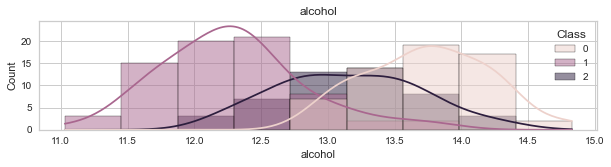

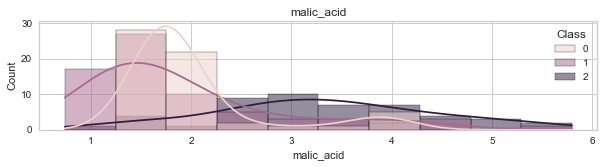

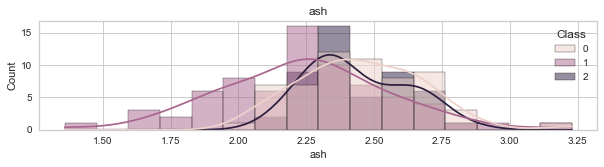

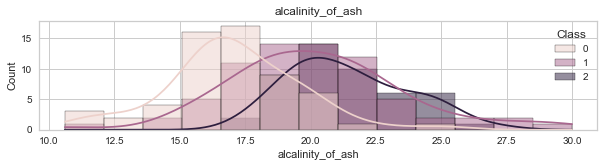

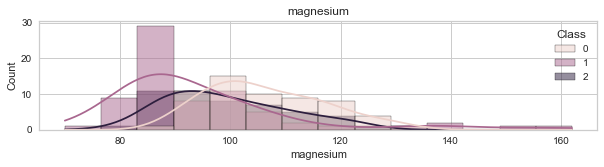

...

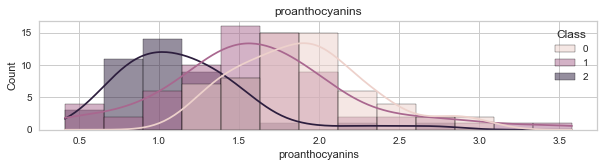

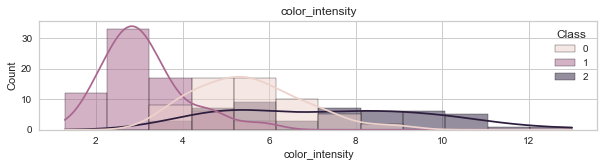

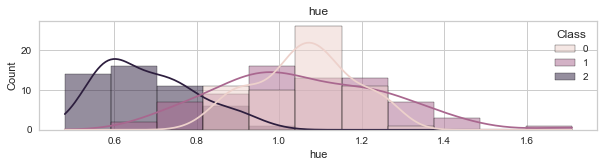

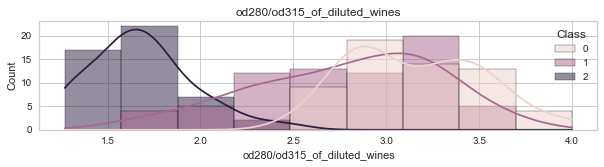

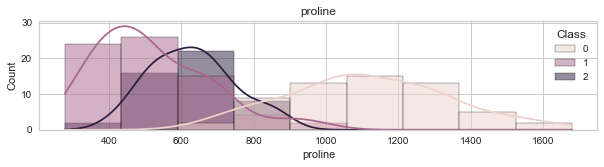

In [5]:
# 변수가 많은 고차원 데이터를 시각화 하는 것은 쉽지 않음
# 분류에 따른 변수별 분포(히스토그램)를 통해 영향력을 확인하는 것이 일반적
for col in X.columns:
    plt.figure(figsize=(10,2))
    sns.histplot(data=pd.concat([Y, X], axis=1), 
                 x=col, hue=Y.columns[0], kde=True)
    plt.title(col)
    plt.show()

In [6]:
# 데이터분리 및 스케일링
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, 
                                                    train_size=0.7, random_state=123)
Y_colname = Y_train.columns
X_colname = X_train.columns
scaler = preprocessing.StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
pd.DataFrame(X_test, columns=X_colname).describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
alcohol,54.00,0.00,1.01,-1.81,-0.75,-0.07,0.72,2.38
malic_acid,54.00,0.00,1.01,-1.40,-0.80,-0.41,0.69,2.61
ash,54.00,0.00,1.01,-2.86,-0.64,-0.03,0.65,3.00
alcalinity_of_ash,54.00,0.00,1.01,-2.54,-0.70,-0.14,0.66,2.23
magnesium,54.00,-0.00,1.01,-1.55,-0.76,-0.22,0.47,4.36
total_phenols,54.00,-0.00,1.01,-1.51,-0.89,-0.07,0.70,1.85
flavanoids,54.00,0.00,1.01,-1.23,-1.00,-0.12,0.77,3.09
nonflavanoid_phenols,54.00,0.00,1.01,-1.84,-0.93,0.01,0.77,1.86
proanthocyanins,54.00,0.00,1.01,-1.75,-0.73,-0.12,0.45,3.47
color_intensity,54.00,0.00,1.01,-1.29,-0.81,-0.11,0.41,2.68


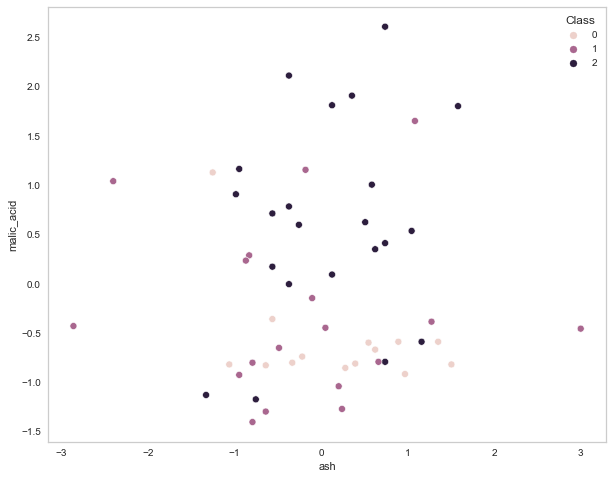

In [7]:
# Test 데이터 시각화
df_test = pd.concat([pd.DataFrame(X_test, columns=X_colname).sample(n=2, axis='columns'), 
                     pd.DataFrame(Y_test, columns=Y_colname).reset_index().iloc[:,1:]], 
                     axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_test.columns[0], y=df_test.columns[1], hue=Y_colname[0], data=df_test)
plt.grid()
plt.show()

## K-means Clustering

In [8]:
# 모델링
model_kmeans = KMeans(n_clusters=len(np.unique(Y_train)), random_state=123)
model_kmeans.fit(X_train, Y_train)
Y_trpred = model_kmeans.predict(X_train)
Y_tepred = model_kmeans.predict(X_test)

In [9]:
# 성능검증
display(measures_cluster(np.ravel(Y_train), X_train, Y_trpred))
display(measures_cluster(np.ravel(Y_test), X_test, Y_tepred))

,Silhouette,ARI,AMI
Score,0.28,0.88,0.84


,Silhouette,ARI,AMI
Score,0.26,0.85,0.82


Predict


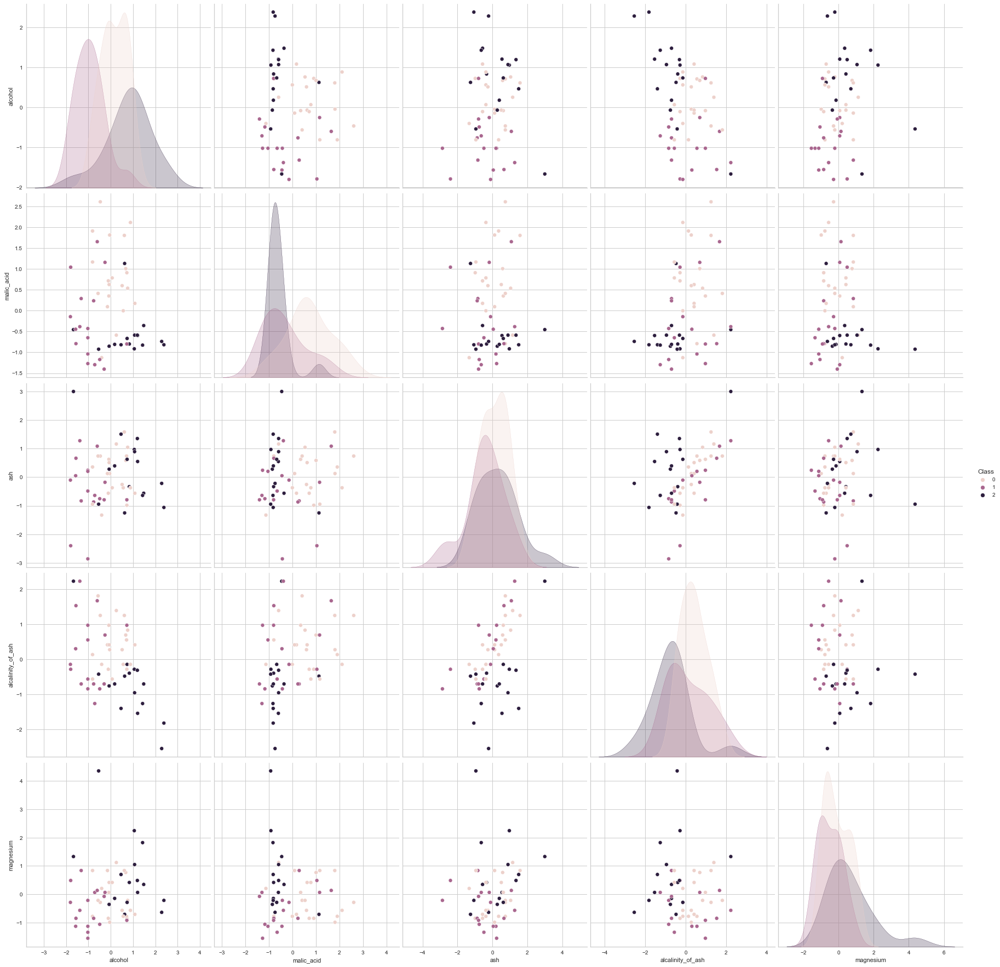

In [10]:
# 성능시각화
print('Predict')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).iloc[:,:5]
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
sns.pairplot(df_tepred, hue='Class', size=5)
plt.grid()
plt.show()

True


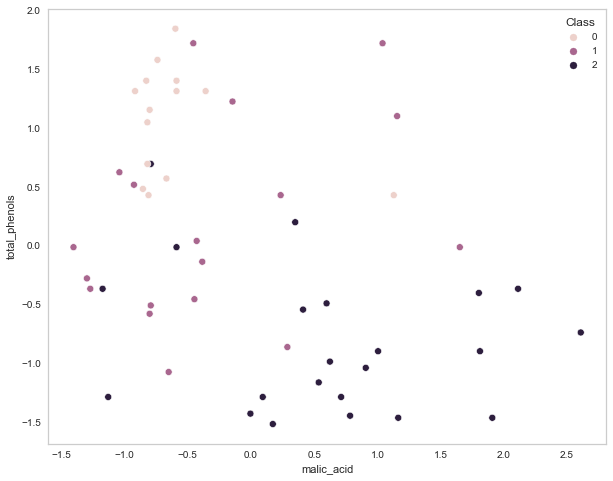

Predict


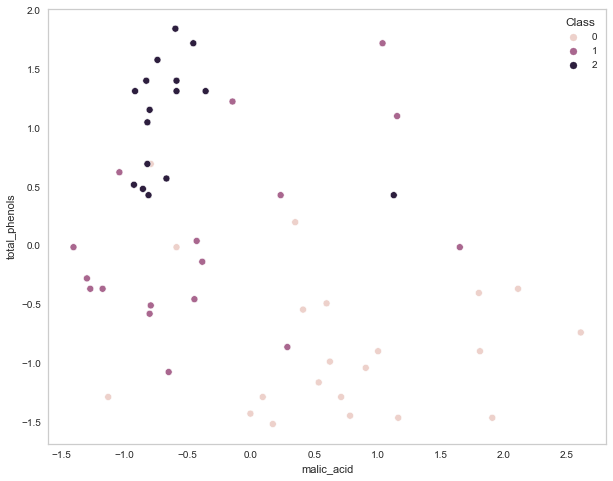

In [11]:
# 성능시각화
print('True')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).sample(n=2, axis='columns')
df_test = pd.concat([X_test_sub, 
                     Y_test.reset_index().iloc[:,[1]]], axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_test.columns[0], y=df_test.columns[1], 
                hue=Y_colname[0], data=df_test)
plt.grid()
plt.show()
print('Predict')
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_tepred.columns[0], y=df_tepred.columns[1], 
                hue=Y_colname[0], data=df_tepred)
plt.grid()
plt.show()

## Hierarchical Clustering

In [12]:
# 데이터의 거리행렬 변환
X_tr_dist = pdist(X_train, metric='euclidean')
X_tr_dist = pd.DataFrame(squareform(X_tr_dist), 
                         index=['ID_'+str(i) for i in range(X_train.shape[0])], 
                         columns=['ID_'+str(i) for i in range(X_train.shape[0])])
X_tr_dist

,ID_0,ID_1,ID_2,ID_3,ID_4,ID_5,ID_6,ID_7,ID_8,ID_9,...,ID_114,ID_115,ID_116,ID_117,ID_118,ID_119,ID_120,ID_121,ID_122,ID_123
ID_0,0.00,5.50,5.54,4.46,3.26,3.72,4.15,3.11,5.48,3.15,...,6.99,2.37,6.45,5.91,6.91,2.90,3.86,4.70,5.18,5.04
ID_1,5.50,0.00,3.82,4.09,4.54,5.39,5.05,4.74,2.94,3.67,...,5.66,4.66,5.81,3.25,4.87,4.67,4.34,4.20,4.43,5.57
ID_2,5.54,3.82,0.00,3.20,5.14,5.18,4.20,4.62,1.95,4.14,...,5.34,4.60,3.85,2.07,4.05,4.94,3.19,4.11,1.72,3.34
ID_3,4.46,4.09,3.20,0.00,5.22,4.32,4.54,4.34,3.32,3.72,...,5.91,4.07,5.31,3.74,6.02,4.49,1.40,2.82,3.29,3.40
ID_4,3.26,4.54,5.14,5.22,0.00,3.51,2.98,2.49,4.68,2.89,...,5.19,2.38,6.08,5.17,5.96,2.55,5.02,5.86,5.25,4.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_119,2.90,4.67,4.94,4.49,2.55,2.13,2.44,3.39,4.89,3.45,...,5.56,1.90,6.13,5.13,5.38,0.00,4.12,5.39,4.48,4.42
ID_120,3.86,4.34,3.19,1.40,5.02,4.06,4.52,4.22,3.46,3.52,...,6.20,3.65,5.25,3.85,5.94,4.12,0.00,2.66,2.92,3.31
ID_121,4.70,4.20,4.11,2.82,5.86,5.40,5.95,5.00,3.59,3.38,...,7.40,4.93,5.66,3.82,6.28,5.39,2.66,0.00,4.12,4.85
ID_122,5.18,4.43,1.72,3.29,5.25,4.68,3.96,4.66,3.02,4.21,...,5.56,4.37,4.22,2.84,4.06,4.48,2.92,4.12,0.00,3.08


In [13]:
# Linkage 계산
opt_linkage = 'ward'
X_tr_link = linkage(X_tr_dist, method=opt_linkage)
X_tr_link = pd.DataFrame(X_tr_link, 
                         columns=['ID First', 'ID Second', 'Distance', 'No. of Items in Clust.'])
X_tr_link

,ID First,ID Second,Distance,No. of Items in Clust.
0,33.00,111.00,2.99,2.00
1,66.00,83.00,3.54,2.00
2,2.00,108.00,3.71,2.00
3,3.00,120.00,3.72,2.00
4,9.00,77.00,3.76,2.00
...,...,...,...,...
118,237.00,239.00,46.80,18.00
119,230.00,238.00,49.73,46.00
120,241.00,242.00,64.74,53.00
121,240.00,244.00,108.84,78.00


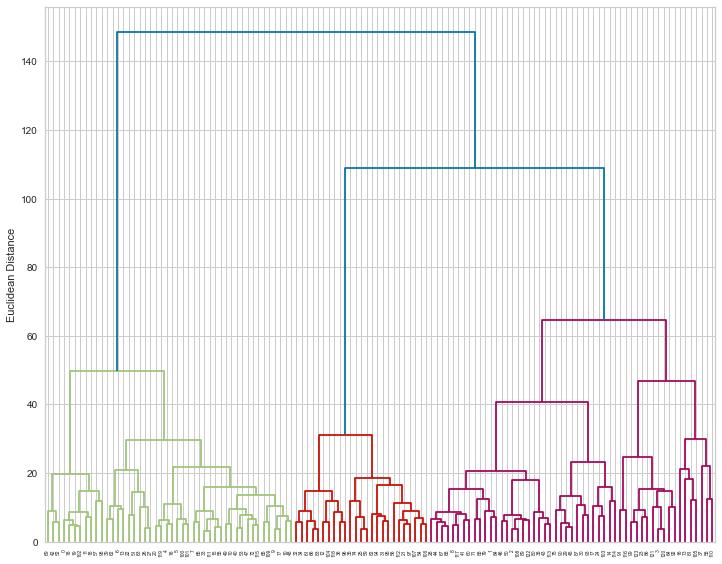

In [14]:
# Dendrogram 시각화
plt.figure(figsize=(10,8))
dendrogram(X_tr_link, orientation='top',
           distance_sort='ascending', 
           show_leaf_counts=True)
plt.tight_layout()
plt.ylabel('Euclidean Distance')
plt.show()

ward


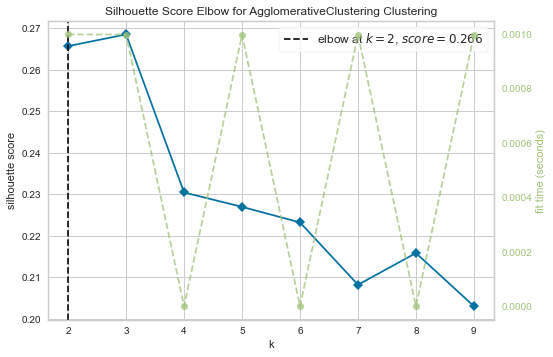

complete


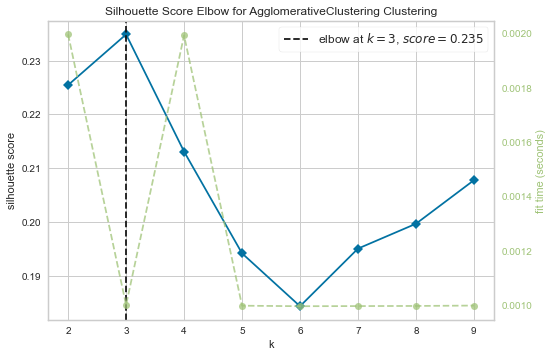

average


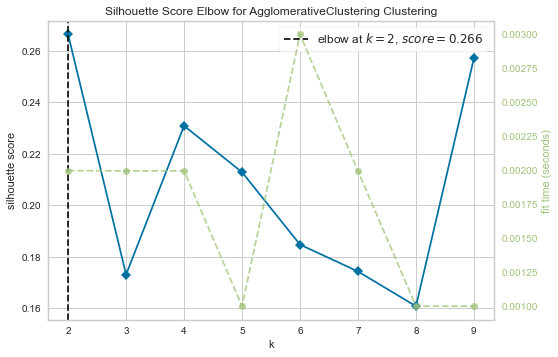

single


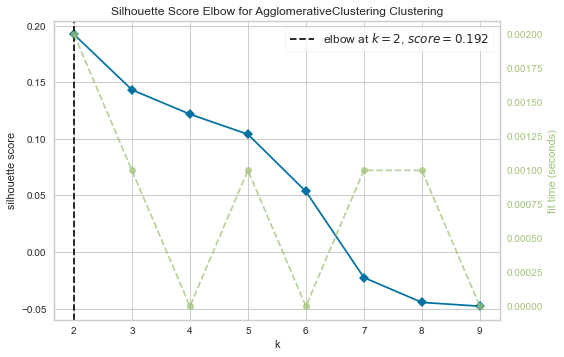

In [15]:
# Number of Cluster 추정
linkage_set = ['ward', 'complete', 'average', 'single']
for link in linkage_set:
    print(link)
    model_link = AgglomerativeClustering(linkage=link, affinity='euclidean')
    plot_elbow = KElbowVisualizer(model_link, k=(2, 10), metric='silhouette', 
                                  timings=True, locate_elbow=True)
    plot_elbow.fit(X_train)
    plot_elbow.show()

In [16]:
# Cluster 추정 및 예측
opt_clustnum = len(np.unique(Y_train))
model_aggclust = AgglomerativeClustering(n_clusters=opt_clustnum, 
                                         linkage=opt_linkage)
Y_trpred = model_aggclust.fit_predict(X_train)
Y_tepred = model_aggclust.fit_predict(X_test)

In [17]:
# 성능검증
display(measures_cluster(np.ravel(Y_train), X_train, Y_trpred))
display(measures_cluster(np.ravel(Y_test), X_test, Y_tepred))

,Silhouette,ARI,AMI
Score,0.27,0.85,0.82


,Silhouette,ARI,AMI
Score,0.25,0.86,0.83


Predict


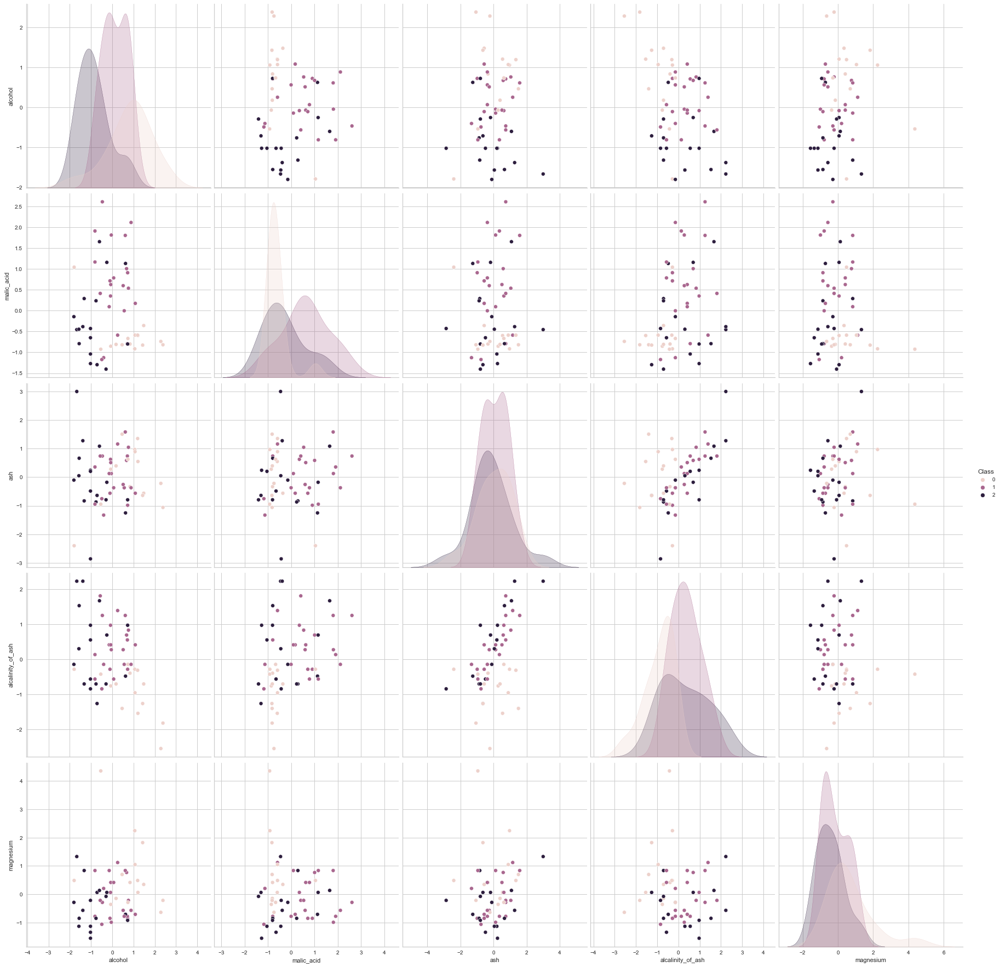

In [18]:
# 성능시각화
print('Predict')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).iloc[:,:5]
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
sns.pairplot(df_tepred, hue='Class', size=5)
plt.grid()
plt.show()

True


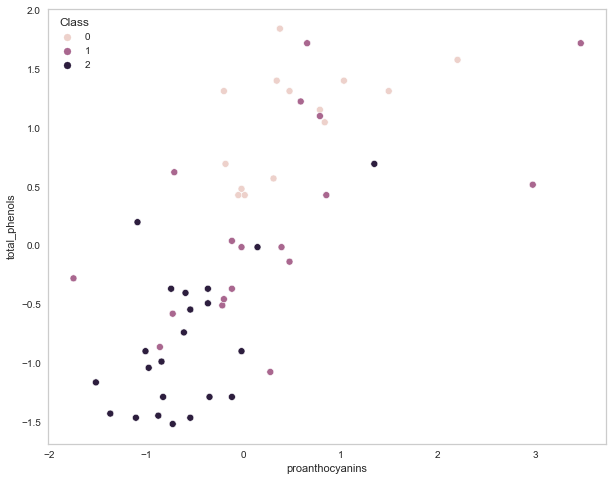

Predict


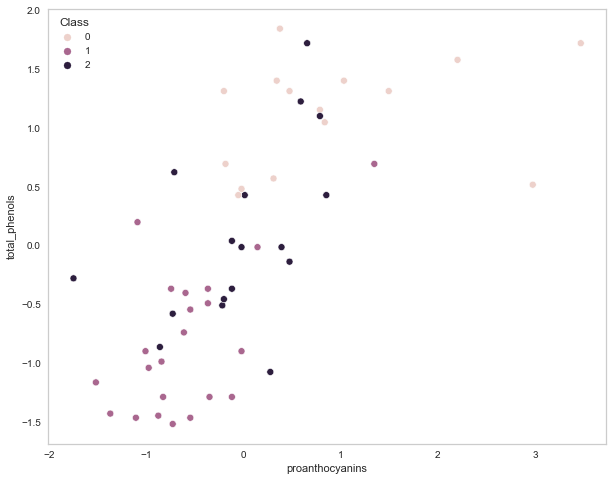

In [19]:
# 성능시각화
print('True')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).sample(n=2, axis='columns')
df_test = pd.concat([X_test_sub, 
                     Y_test.reset_index().iloc[:,[1]]], axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_test.columns[0], y=df_test.columns[1], 
                hue=Y_colname[0], data=df_test)
plt.grid()
plt.show()
print('Predict')
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_tepred.columns[0], y=df_tepred.columns[1], 
                hue=Y_colname[0], data=df_tepred)
plt.grid()
plt.show()

## DBSCAN

In [20]:
# 모델링
model_dbscan = DBSCAN(eps=3, min_samples=5)
Y_tepred = model_dbscan.fit_predict(X_test)

In [21]:
# 성능검증
display(measures_cluster(np.ravel(Y_train), X_train, Y_trpred))
display(measures_cluster(np.ravel(Y_test), X_test, Y_tepred))

,Silhouette,ARI,AMI
Score,0.27,0.85,0.82


,Silhouette,ARI,AMI
Score,0.23,0.54,0.56


Predict


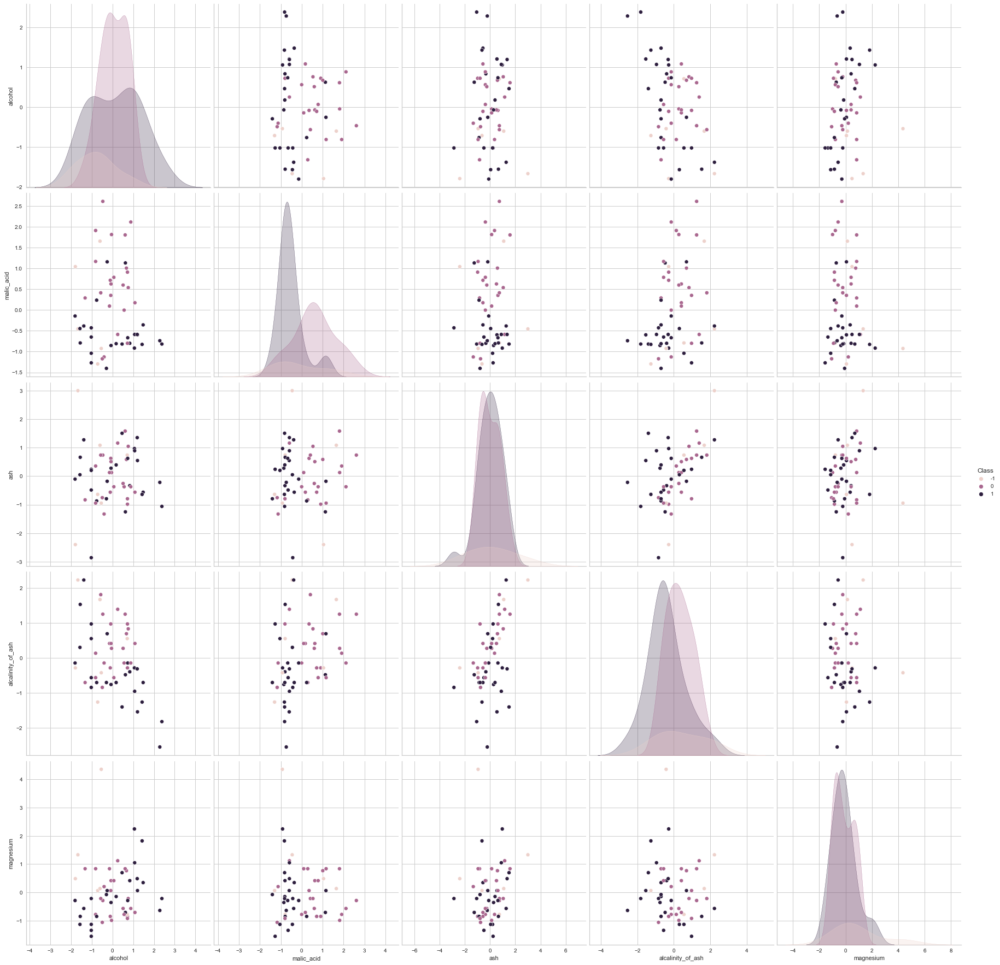

In [22]:
# 성능시각화
print('Predict')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).iloc[:,:5]
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
sns.pairplot(df_tepred, hue='Class', size=5)
plt.grid()
plt.show()

True


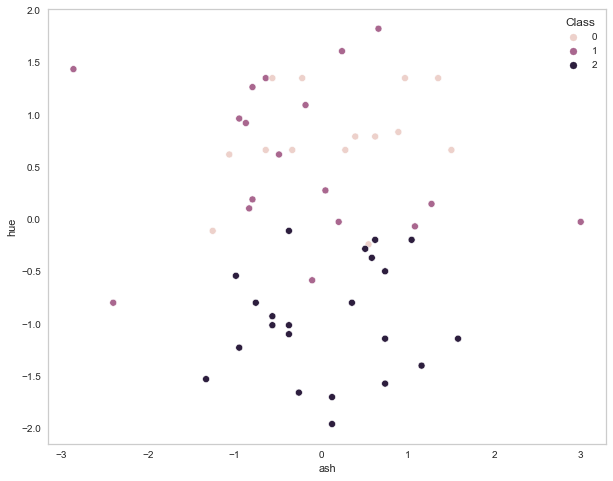

Predict


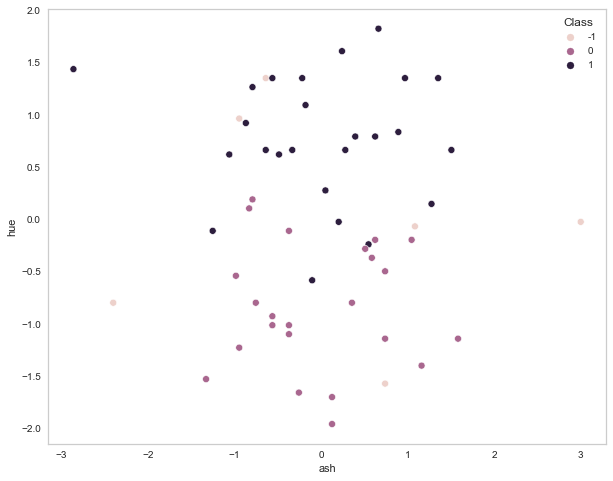

In [23]:
# 성능시각화
print('True')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).sample(n=2, axis='columns')
df_test = pd.concat([X_test_sub, 
                     Y_test.reset_index().iloc[:,[1]]], axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_test.columns[0], y=df_test.columns[1], 
                hue=Y_colname[0], data=df_test)
plt.grid()
plt.show()
print('Predict')
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_tepred.columns[0], y=df_tepred.columns[1], 
                hue=Y_colname[0], data=df_tepred)
plt.grid()
plt.show()

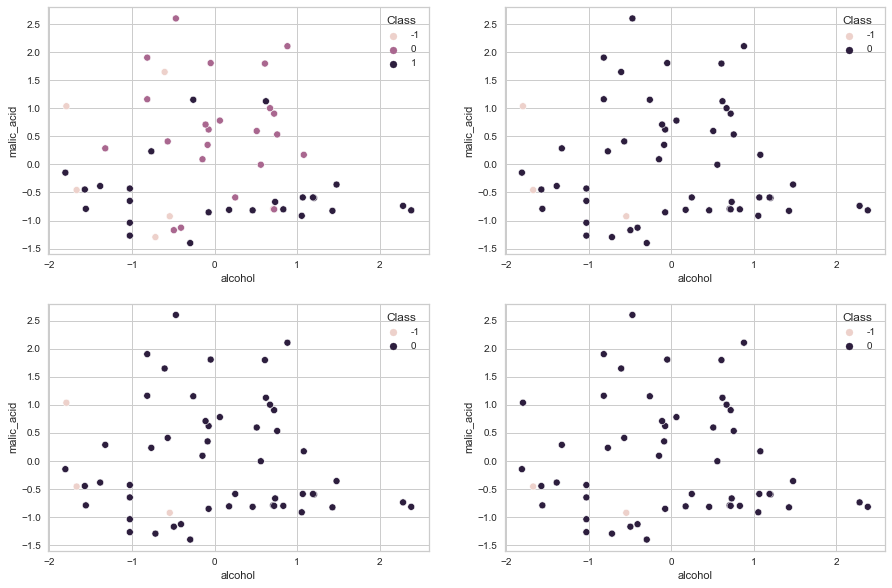

,Silhouette,ARI,AMI
Score,0.23,0.54,0.56
Score,0.28,0.01,0.06
Score,0.28,0.01,0.06
Score,0.28,0.01,0.03


In [24]:
# eps 파라미터 변경에 따른 성능 변화
eps_list = [3, 3.5, 4, 4.5]
score_para = pd.DataFrame()
fig, axes = plt.subplots(2, 2, figsize=(15,10))
for eps, ax in zip(eps_list, axes.ravel()):
    ## 모델링
    model_dbscan = DBSCAN(eps=eps, min_samples=5)
    Y_tepred = model_dbscan.fit_predict(X_test)
    ## 성능검증
    score_para = pd.concat([score_para, 
                            measures_cluster(np.ravel(Y_test), X_test, Y_tepred)], axis=0)
    ## 성능시각화
    df_tepred = pd.concat([pd.DataFrame(X_test, columns=X_colname), 
                           pd.DataFrame(Y_tepred, columns=Y_colname)], axis=1)
    sns.scatterplot(x=df_tepred.columns[0], y=df_tepred.columns[1], 
                    hue=Y_colname[0], data=df_tepred, ax=ax)
plt.show()
score_para

## Linear Discriminant Analysis

In [25]:
# 모델링
model_lda = LinearDiscriminantAnalysis()
model_lda.fit(X_train, Y_train)
Y_trpred = model_lda.predict(X_train)
Y_tepred = model_lda.predict(X_test)

In [26]:
# 성능검증
display(measures_cluster(np.ravel(Y_train), X_train, Y_trpred))
display(measures_cluster(np.ravel(Y_test), X_test, Y_tepred))

,Silhouette,ARI,AMI
Score,0.28,1.00,1.00


,Silhouette,ARI,AMI
Score,0.22,0.73,0.75


Predict


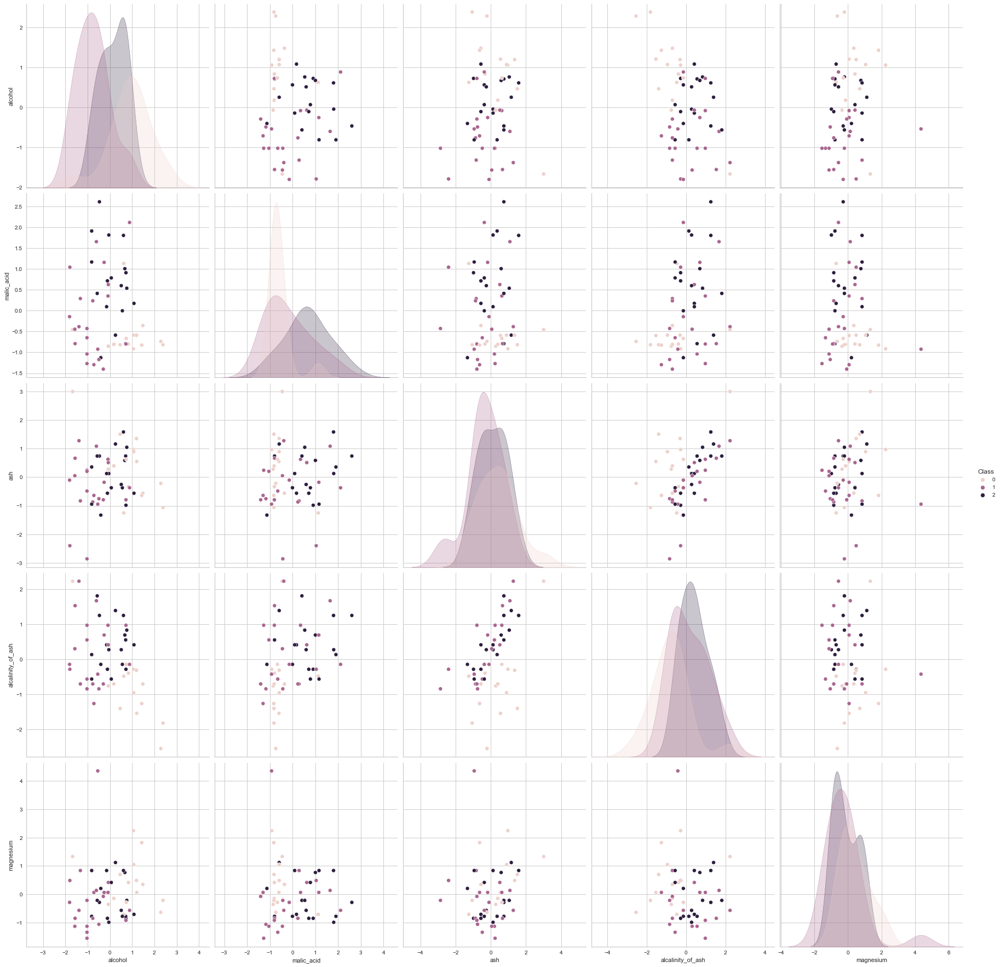

In [27]:
# 성능시각화
print('Predict')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).iloc[:,:5]
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
sns.pairplot(df_tepred, hue='Class', size=5)
plt.grid()
plt.show()

True


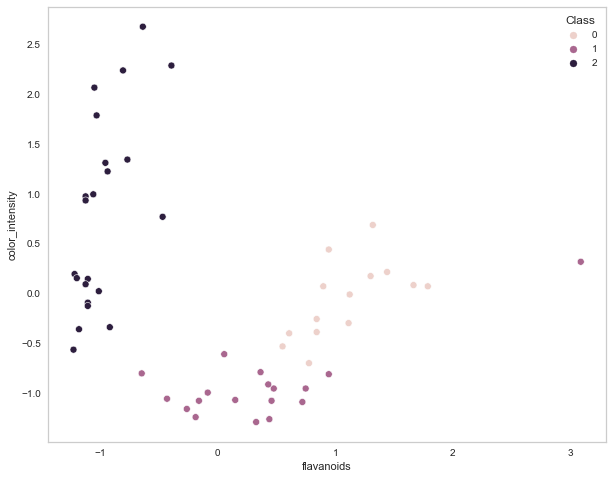

Predict


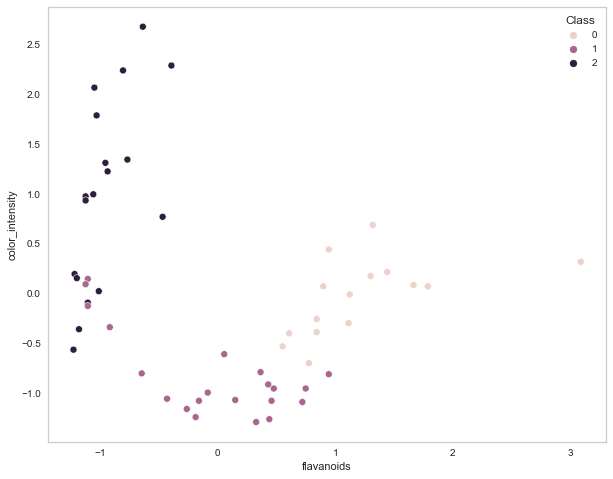

In [28]:
# 성능시각화
print('True')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).sample(n=2, axis='columns')
df_test = pd.concat([X_test_sub, 
                     Y_test.reset_index().iloc[:,[1]]], axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_test.columns[0], y=df_test.columns[1], 
                hue=Y_colname[0], data=df_test)
plt.grid()
plt.show()
print('Predict')
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_tepred.columns[0], y=df_tepred.columns[1], 
                hue=Y_colname[0], data=df_tepred)
plt.grid()
plt.show()

## Quadratic Discriminant Analysis

In [29]:
# 모델링
model_qda = QuadraticDiscriminantAnalysis()
model_qda.fit(X_train, Y_train)
Y_trpred = model_qda.predict(X_train)
Y_tepred = model_qda.predict(X_test)

In [30]:
# 성능검증
display(measures_cluster(np.ravel(Y_train), X_train, Y_trpred))
display(measures_cluster(np.ravel(Y_test), X_test, Y_tepred))

,Silhouette,ARI,AMI
Score,0.28,0.97,0.96


,Silhouette,ARI,AMI
Score,0.17,0.54,0.69


Predict


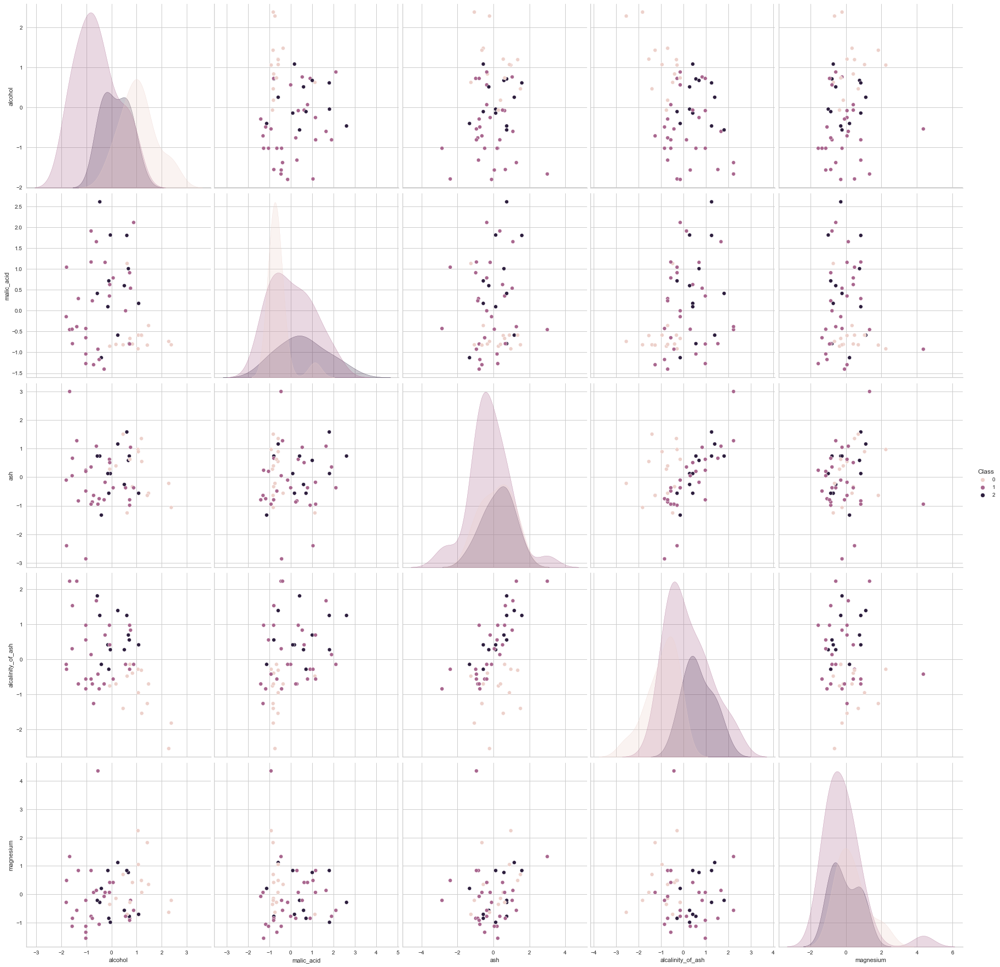

In [31]:
# 성능시각화
print('Predict')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).iloc[:,:5]
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
sns.pairplot(df_tepred, hue='Class', size=5)
plt.grid()
plt.show()

True


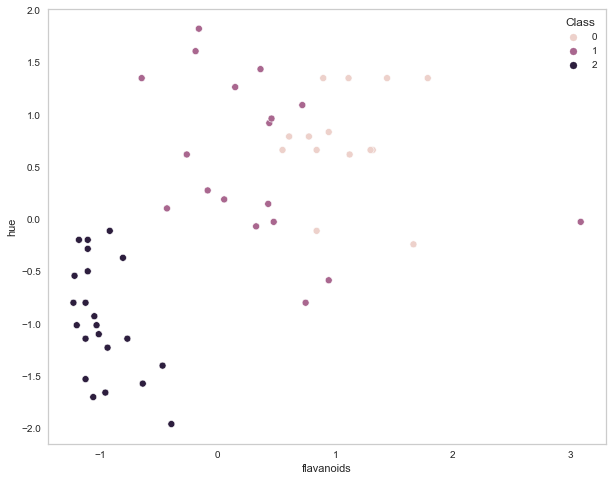

Predict


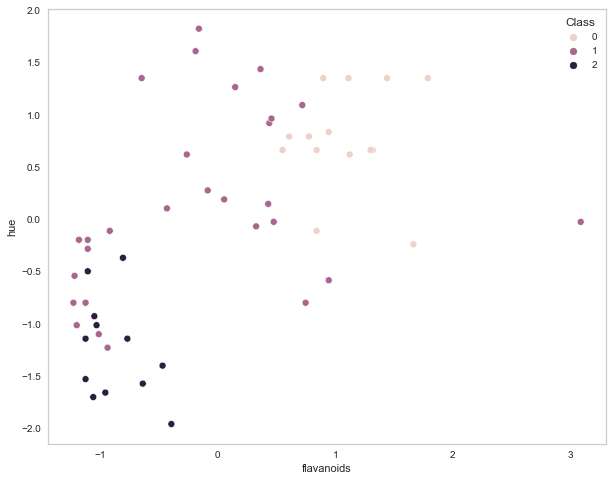

In [32]:
# 성능시각화
print('True')
X_test_sub = pd.DataFrame(X_test, columns=X_colname).sample(n=2, axis='columns')
df_test = pd.concat([X_test_sub, 
                     Y_test.reset_index().iloc[:,[1]]], axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_test.columns[0], y=df_test.columns[1], 
                hue=Y_colname[0], data=df_test)
plt.grid()
plt.show()
print('Predict')
df_tepred = pd.concat([X_test_sub, 
                       pd.DataFrame(Y_tepred, columns=Y_colname)], 
                       axis=1)
plt.figure(figsize = (10,8))
sns.scatterplot(x=df_tepred.columns[0], y=df_tepred.columns[1], 
                hue=Y_colname[0], data=df_tepred)
plt.grid()
plt.show()

# **Real Data Analysis:** Medical Checkup

| **변수명** 	| **의미** 	|
|:---:	|:---:	|
| **ID** 	| 가입자일련번호 	|
| **Sex** 	| 성별코드 	|
| **Age** 	| 연령대코드(5세단위) 	|
| **City** 	| 시도코드 	|
| **Height** 	| 신장(5Cm단위) 	|
| **Weight** 	| 체중(5Kg단위) 	|
| **Waist** 	| 허리둘레 	|
| **Eyesight_Left** 	| 시력(좌) 	|
| **Eyesight_Right** 	| 시력(우) 	|
| **Hearing_Left** 	| 청력(좌) 	|
| **Hearing_Right** 	| 청력(우) 	|
| **BloodPressure_Max** 	| 수축기혈압 	|
| **BloodPressure_Min** 	| 이완기혈압 	|
| **BloodSugar** 	| 식전혈당(공복혈당) 	|
| **Cholesterol** 	| 총콜레스테롤 	|
| **Triglycerides** 	| 트리글리세라이드 	|
| **HDL** 	| HDL콜레스테롤 	|
| **LDL** 	| LDL콜레스테롤 	|
| **Hemoglobin** 	| 혈색소 	|
| **Protein** 	| 요단백 	|
| **SerumCreatinine** 	| 혈청크레아티닌 	|
| **SerumAST** 	| (혈청지오티)AST 	|
| **SerumALT** 	| (혈청지오티)ALT 	|
| **LiverGTP** 	| 감마지티피 	|
| **Smoking** 	| 흡연상태 	|
| **MouthExam** 	| 구강검진 수검여부 	|
| **Scale** 	| 치석 	|

## `Data Preprocessing`

In [33]:
# 데이터 로딩
df = pd.read_csv(os.path.join('.', 'Data', 'MedicalCheckup', 'hme.csv'))
df.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
ID,"1,000.00","509,749.79","289,935.02",87.00,"249,239.75","536,235.50","765,463.00","999,514.00"
Sex,"1,000.00",1.49,0.50,1.00,1.00,1.00,2.00,2.00
Age,"1,000.00",52.75,14.15,8.00,45.00,55.00,60.00,90.00
City,"1,000.00",33.15,12.81,11.00,27.00,41.00,43.00,49.00
Height,"1,000.00",161.70,9.38,140.00,155.00,160.00,170.00,185.00
...,...,...,...,...,...,...,...,...
SerumALT,"1,000.00",25.59,21.69,5.00,14.00,20.00,29.00,350.00
LiverGTP,"1,000.00",36.93,55.28,6.00,15.00,22.00,38.25,797.00
Smoking,"1,000.00",1.60,0.81,1.00,1.00,1.00,2.00,3.00
MouthExam,"1,000.00",0.39,0.49,0.00,0.00,0.00,1.00,1.00


In [34]:
# 전처리
# 개인정보 삭제
if 'ID' in df.columns:
    del df['ID']
    
# 데이터가 비어있는 고객 삭제
df.dropna(axis=0, inplace=True)

# 데이터 오류 삭제
df = df[df['Eyesight_Right'] <= 2]

In [35]:
# 데이터분리
X_train, X_test = train_test_split(df, train_size=0.7, random_state=123)
X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Sex,691.00,1.49,0.50,1.00,1.00,1.00,2.00,2.00
Age,691.00,52.49,14.10,8.00,40.00,55.00,60.00,90.00
City,691.00,33.24,12.62,11.00,27.00,41.00,43.00,49.00
Height,691.00,161.94,9.27,140.00,155.00,160.00,170.00,185.00
Weight,691.00,63.23,12.76,35.00,55.00,60.00,70.00,130.00
...,...,...,...,...,...,...,...,...
SerumALT,691.00,26.13,22.65,5.00,15.00,20.00,30.00,350.00
LiverGTP,691.00,38.43,62.63,6.00,15.00,22.00,39.00,797.00
Smoking,691.00,1.60,0.81,1.00,1.00,1.00,2.00,3.00
MouthExam,691.00,0.39,0.49,0.00,0.00,0.00,1.00,1.00


In [36]:
# 카테고리 변수의 더미변수 생성
# 샘플의 수가 적어서 Dummy 변수 생성은 일부만 실행
colname_category = X_train.columns[X_train.describe().T['max']<5]
X_train[colname_category] = X_train[colname_category].astype(str)
X_test[colname_category] = X_test[colname_category].astype(str)
X_train = pd.get_dummies(X_train, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
X_train.shape, X_test.shape

((691, 41), (297, 41))

In [37]:
# 스케일링
X_colname = X_train.columns
scaler = preprocessing.StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
pd.DataFrame(X_test, columns=X_colname).describe().T

,count,mean,std,min,25%,50%,75%,max
Age,297.00,0.00,1.00,-2.02,-0.59,0.13,0.84,2.27
City,297.00,-0.00,1.00,-1.68,-0.54,0.60,0.83,1.21
Height,297.00,-0.00,1.00,-2.23,-0.65,-0.13,0.92,2.50
Weight,297.00,-0.00,1.00,-2.19,-0.56,-0.15,0.66,5.14
Waist,297.00,0.00,1.00,-2.22,-0.59,-0.04,0.72,4.21
...,...,...,...,...,...,...,...,...
Smoking_2,297.00,0.00,1.00,-0.48,-0.48,-0.48,-0.48,2.07
Smoking_3,297.00,0.00,1.00,-0.50,-0.50,-0.50,-0.50,1.99
MouthExam_1,297.00,-0.00,1.00,-0.79,-0.79,-0.79,1.26,1.26
Scale_1.0,297.00,0.00,1.00,-0.50,-0.50,-0.50,-0.50,2.01


## Principal Component Analysis

In [38]:
# 데이터의 주성분 추출
model_pca = PCA()
model_pca.fit(X_train)
X_train_pca = model_pca.transform(X_train)
X_test_pca = model_pca.transform(X_test)

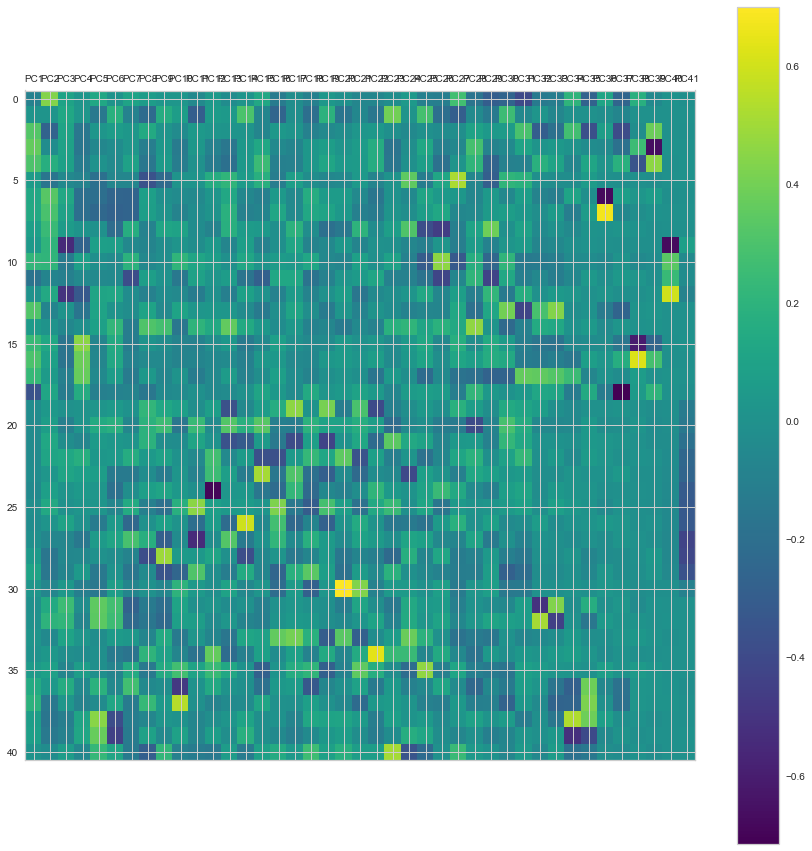

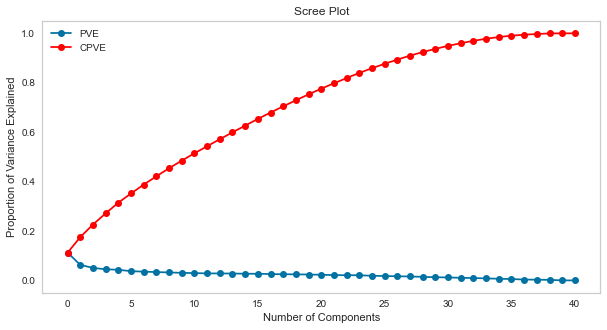

In [39]:
# 고유벡터 시각화 및 변수별 이해
plt.figure(figsize=(15,15))
plt.matshow(model_pca.components_.T, cmap='viridis', fignum=1)
colnames = ['PC'+str(i) for i in range(1, X_train_pca.shape[1]+1)]
plt.xticks([i for i in range(X_train_pca.shape[1])], colnames)
plt.colorbar()
plt.show()

# Scree Plot
plt.figure(figsize=(10,5))
plt.plot(model_pca.explained_variance_ratio_, 'o-', label='PVE')
plt.plot(model_pca.explained_variance_ratio_.cumsum(), 'o-', c='red', label='CPVE')
plt.legend()
plt.title('Scree Plot')
plt.xlabel('Number of Components')
plt.ylabel('Proportion of Variance Explained')
plt.grid()
plt.show()

In [40]:
# 최적 주성분 갯수
n_optpc = (model_pca.explained_variance_ratio_.cumsum() < 0.8).sum()
n_optpc

23

In [41]:
# 주성분 데이터 정리
colnames = ['PC'+str(i) for i in range(1, X_train_pca.shape[1]+1)]
X_train_pca = pd.DataFrame(X_train_pca, columns=colnames).iloc[:,:n_optpc]
X_test_pca = pd.DataFrame(X_test_pca, columns=colnames).iloc[:,:n_optpc]

In [42]:
# 데이터의 분포 통계량 확인
X_train_pca.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23
count,691.00,691.00,691.00,691.00,691.00,691.00,691.00,691.00,691.00,691.00,...,691.00,691.00,691.00,691.00,691.00,691.00,691.00,691.00,691.00,691.00
mean,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,...,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00
std,2.15,1.61,1.44,1.36,1.33,1.24,1.21,1.18,1.15,1.12,...,1.07,1.06,1.05,1.03,1.01,1.01,0.99,0.97,0.94,0.93
min,-3.98,-4.13,-5.75,-3.19,-4.46,-4.40,-4.62,-6.10,-3.61,-5.12,...,-2.78,-5.20,-3.24,-2.94,-3.66,-4.20,-2.56,-3.06,-4.00,-2.91
25%,-1.76,-1.14,-0.87,-0.80,-0.92,-0.66,-0.73,-0.59,-0.83,-0.73,...,-0.71,-0.50,-0.71,-0.61,-0.69,-0.41,-0.52,-0.53,-0.42,-0.57
50%,-0.10,0.00,0.00,-0.14,-0.20,0.02,0.06,-0.00,-0.11,-0.02,...,-0.12,-0.08,-0.01,-0.13,-0.02,0.08,-0.15,0.01,-0.03,-0.06
75%,1.51,1.01,0.95,0.63,0.76,0.71,0.77,0.63,0.76,0.59,...,0.55,0.41,0.69,0.49,0.66,0.52,0.23,0.45,0.37,0.48
max,11.31,7.91,6.54,11.53,6.86,7.69,5.92,9.95,8.72,5.43,...,4.26,5.94,3.71,5.88,3.84,4.81,8.67,5.47,5.27,4.66


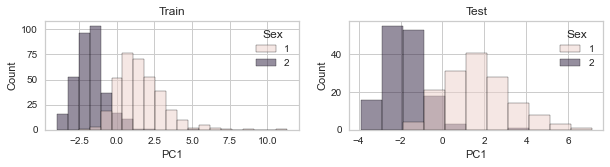

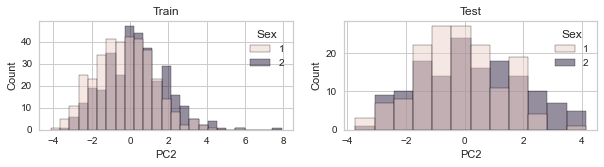

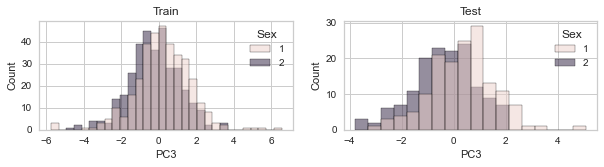

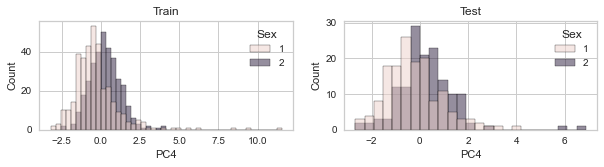

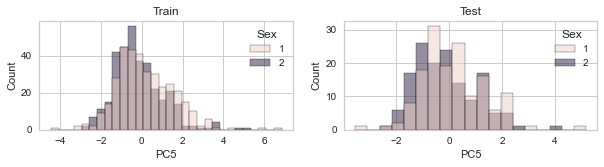

...

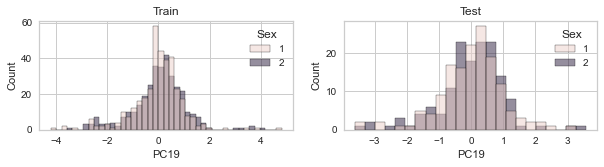

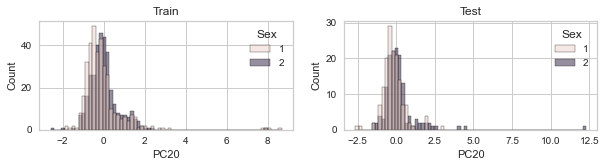

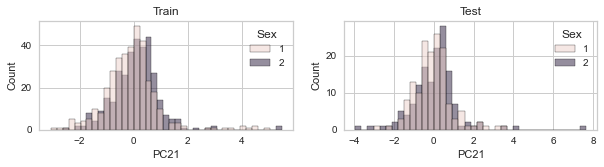

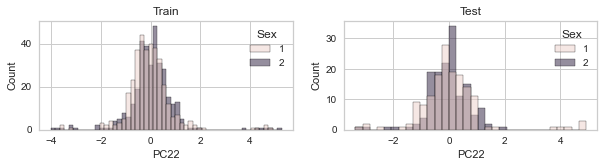

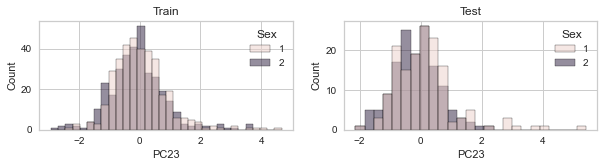

In [43]:
# 성별에 따른 주성분의 분포 분류 차이 확인
X_train, X_test = train_test_split(df, train_size=0.7, random_state=123)
X_train_pcadesc = pd.concat([X_train['Sex'].reset_index().iloc[:,1:], X_train_pca], axis=1)
X_test_pcadesc = pd.concat([X_test['Sex'].reset_index().iloc[:,1:], X_test_pca], axis=1)

for col in X_train_pcadesc.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=X_train_pcadesc, x=col, hue='Sex', ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=X_test_pcadesc, x=col, hue='Sex', ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Factor Analysis

In [44]:
# 요인추출 가능성 확인
# Bartlett's Test
statistics_bar, p_value = calculate_bartlett_sphericity(X_train)
statistics_bar, p_value

(8997.870013166505, 0.0)

In [45]:
# 요인추출 가능성 확인
# Kalser-Meyer-Olkln (KMO) Test
kmo_each, kmo_all = calculate_kmo(X_train)
kmo_each, kmo_all

(array([0.76220676, 0.59937781, 0.43565605, 0.74716252, 0.7046406 ,
        0.66527592, 0.68435847, 0.73724397, 0.53438865, 0.56079019,
        0.61113136, 0.61862403, 0.86688811, 0.26244457, 0.25817816,
        0.19019019, 0.22344423, 0.86291023, 0.53337506, 0.69444218,
        0.63634543, 0.70684482, 0.87277165, 0.86785452, 0.54844589,
        0.5497377 ]),
 0.5537976445876851)

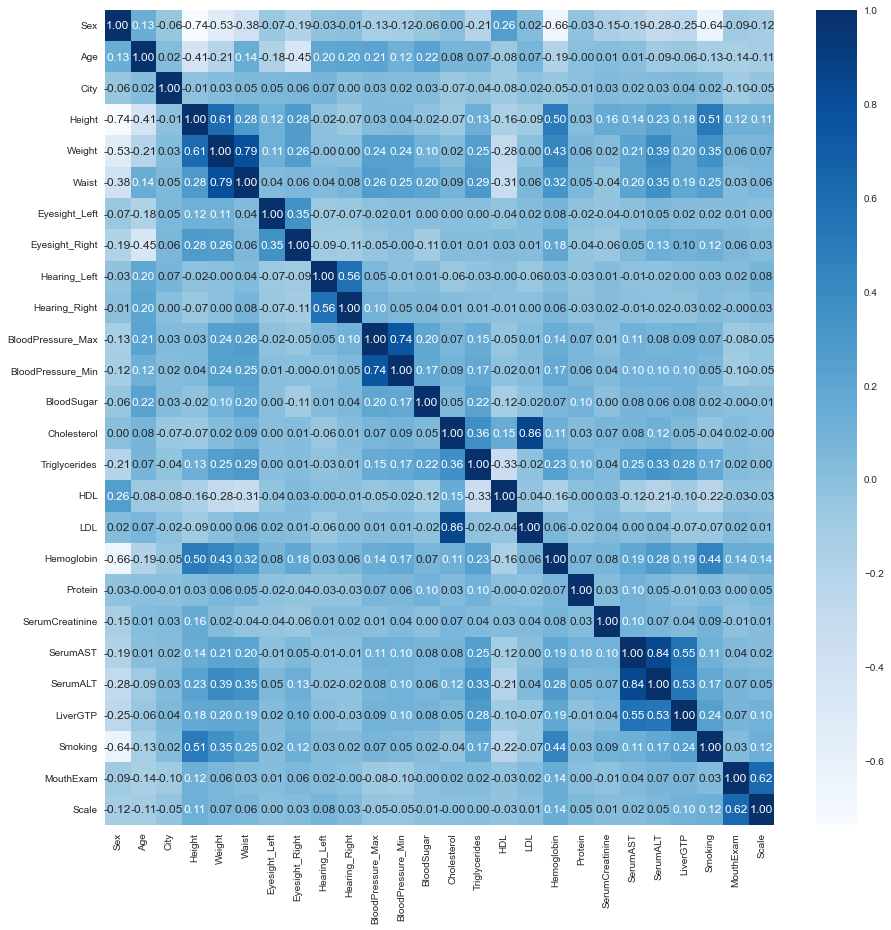

In [46]:
# 상관관계
# 강하게 묶이는 변수 관계성 확인
plt.figure(figsize=(15,15))
sns.heatmap(pd.DataFrame(X_train).corr(), 
            cmap='Blues', annot=True, fmt='.2f')
plt.show()

,Original_Eigenvalues,Factor_Eigenvalues
0,4.64,4.49
1,2.51,2.34
2,1.98,1.87
3,1.79,1.70
4,1.74,1.44
...,...,...
21,0.24,-0.05
22,0.16,-0.10
23,0.13,-0.11
24,0.10,-0.15


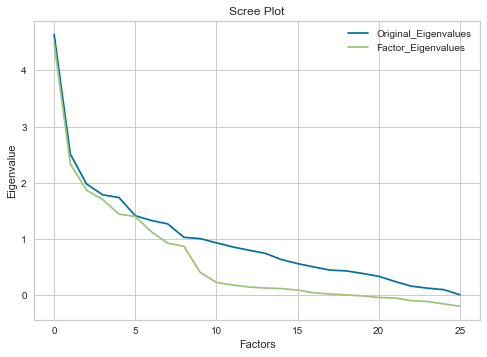

In [47]:
# 모델링1
# 최적 요인 수 추론
model_fa = FactorAnalyzer(n_factors=10)
model_fa.fit(X_train)
eigenvalues, factor_eigenvalues = model_fa.get_eigenvalues()
fa_result = pd.DataFrame([eigenvalues, factor_eigenvalues], 
                          index=['Original_Eigenvalues', 'Factor_Eigenvalues']).T
display(fa_result)

# Create scree plot using matplotlib
fa_result.plot()
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

In [48]:
# 최적 요인 갯수
n_optfactor = (fa_result['Original_Eigenvalues']>=1).sum()
n_optfactor

10

In [49]:
# 모델링2
# 최적 요인 수 비교를 위한 귀무가설/대중주장/H0 확인
# 요인 적재량 확인
model_fa = FactorAnalyzer(n_factors=n_optfactor, rotation='varimax')
model_fa.fit(X_train)
colnames = ['Factor' + str(i) for i in range(n_optfactor)]
fa_loadings = pd.DataFrame(model_fa.loadings_, 
                           index=X_train.columns,
                           columns=colnames)
fa_loadings

,Factor0,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9
Sex,-0.94,-0.11,0.00,-0.07,-0.15,-0.06,-0.06,-0.00,-0.05,-0.18
Age,-0.22,-0.03,0.10,0.18,0.01,-0.09,-0.56,0.19,0.10,0.35
City,0.00,0.03,-0.04,0.02,0.01,-0.09,0.07,0.05,-0.04,0.19
Height,0.75,0.08,-0.11,-0.03,0.26,0.05,0.24,-0.04,-0.01,-0.18
Weight,0.40,0.15,-0.02,0.16,0.86,0.01,0.22,0.00,0.06,-0.08
...,...,...,...,...,...,...,...,...,...,...
SerumALT,0.14,0.86,0.05,0.01,0.22,0.02,0.07,-0.02,0.10,0.04
LiverGTP,0.18,0.56,-0.03,0.07,0.01,0.07,0.05,-0.00,0.14,0.05
Smoking,0.65,0.08,-0.06,0.01,0.09,0.04,0.04,0.01,0.08,0.10
MouthExam,0.04,0.04,0.01,-0.06,0.03,0.86,0.04,-0.01,0.02,-0.09


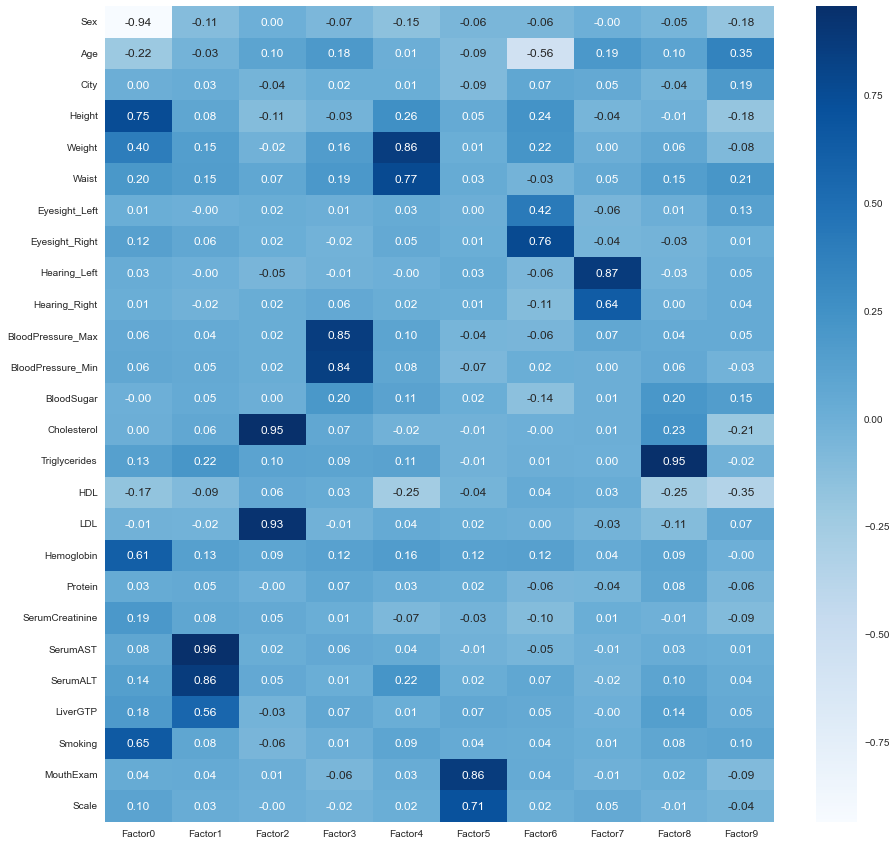

,Factor0,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9
Sex,-0.935832,-0.109916,0.000155,-0.065769,-0.147612,-0.057719,-0.062240,-0.002717,-0.047950,-0.177814
Age,-0.218563,-0.034319,0.098106,0.179830,0.007241,-0.091334,-0.556126,0.189480,0.103179,0.351381
City,0.004647,0.030913,-0.038148,0.015421,0.012995,-0.089667,0.072204,0.049198,-0.036991,0.186590
Height,0.751333,0.076828,-0.106354,-0.029735,0.255447,0.045600,0.237935,-0.044338,-0.008839,-0.183885
Weight,0.399964,0.148292,-0.017195,0.157956,0.858828,0.009921,0.221469,0.003260,0.064555,-0.080973
Waist,0.199761,0.151102,0.070795,0.190412,0.766344,0.032592,-0.029904,0.047074,0.148767,0.210003
Eyesight_Left,0.013999,-0.001263,0.021828,0.007337,0.034321,0.002798,0.420265,-0.056212,0.005386,0.127422
Eyesight_Right,0.122609,0.064839,0.015368,-0.020281,0.046903,0.010607,0.764911,-0.043163,-0.032865,0.011746
Hearing_Left,0.026740,-0.002624,-0.049993,-0.012693,-0.001635,0.034280,-0.064207,0.870041,-0.026846,0.045311
Hearing_Right,0.010831,-0.019322,0.018976,0.055108,0.024039,0.014221,-0.107428,0.636182,0.002700,0.042911


,Factor0,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9
Variance,2.66,2.13,1.83,1.62,1.61,1.30,1.27,1.22,1.18,0.52
Proportional Variance,0.10,0.08,0.07,0.06,0.06,0.05,0.05,0.05,0.05,0.02
Cumulative Variances,0.10,0.18,0.25,0.32,0.38,0.43,0.48,0.53,0.57,0.59


In [50]:
# 귀무가설/대중주장/H0에서의 요인과 변수관계 시각화
## Heatmap 시각화
plt.figure(figsize=(15,15))
sns.heatmap(fa_loadings, cmap='Blues', annot=True, fmt='.2f')
plt.show()

## 테이블강조 시각화
criteria = pd.Series([0.5]*n_optfactor, index=colnames)
fa_loadings_light = fa_loadings.style.highlight_between(left=criteria, right=1, axis=1, 
                                                        props='color:white; background-color:purple;')
criteria = pd.Series([-1]*n_optfactor, index=colnames)
fa_loadings_light = fa_loadings_light.highlight_between(left=criteria, right=-0.5, axis=1, 
                                                        props='color:white; background-color:purple;')
display(fa_loadings_light)

## 분산설명력 테이블강조
fa_variance = pd.DataFrame(model_fa.get_factor_variance(), columns=colnames,
                           index=['Variance', 'Proportional Variance', 'Cumulative Variances'])
fa_variance

In [51]:
# 공통성 추정
# 변수의 분산이 추출된 요인들에 의해 설명되는 정도로 0.5이상 굳
fa_communality = pd.DataFrame(model_fa.get_communalities(), 
                              index=X_train.columns, columns=['Communality'])

criteria = pd.Series([0.5]*len(fa_communality.columns), index=fa_communality.columns)
fa_communality_light = fa_communality.style.highlight_between(left=criteria, right=10, axis=1, 
                                                              props='color:white; background-color:purple;')
fa_communality_light

,Communality
Sex,0.955108
Age,0.578598
City,0.054697
Height,0.742403
Weight,1.004676
Waist,0.761694
Eyesight_Left,0.197962
Eyesight_Right,0.610367
Hearing_Left,0.768428
Hearing_Right,0.422784


In [52]:
# 변수들이 특정 요인으로 묶이는지 여부 확인
# 설문조사에서는 역으로 특정 항목(요인)을 확인하는 설문 질문들이
# 일관성 있는 유의정도(Factor Loading)인지 여부 확인하여 질문의 타당성 확인
# 일반적으로 크롬바흐 알파계수로 판단
import pingouin as pg

colA = ['Sex', 'Age']
colB = ['Height', 'Weight', 'Waist']
colC = ['Eyesight_Right', 'Hearing_Left']
colD = ['BloodPressure_Max', 'BloodPressure_Min']
colE = ['SerumAST', 'SerumALT']
colF = ['MouthExam', 'Scale']

df_cronbach = []
for col_sub in [colA, colB, colC, colD, colE, colF]:
    df_cronbach.append(pg.cronbach_alpha(data=df[col_sub])[0])
pd.DataFrame(df_cronbach, columns=['Cronbach Alpha'],
             index=['A', 'B', 'C', 'D', 'E', 'F'])

,Cronbach Alpha
A,0.02
B,0.81
C,-0.23
D,0.82
E,0.84
F,0.77


In [53]:
# 원데이터에서 요인 잠재변수 추출
X_train_fa = pd.DataFrame(model_fa.transform(X_train), columns=colnames)
X_test_fa = pd.DataFrame(model_fa.transform(X_test), columns=colnames)
X_test_fa

,Factor0,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9
0,0.89,-0.73,-0.01,-0.40,-0.80,-0.53,0.59,-0.20,-0.44,2.03
1,-0.74,0.01,1.24,-0.62,-0.58,0.84,-0.84,-0.25,-0.23,-0.53
2,0.99,-0.86,-0.05,-0.58,-0.68,1.38,-0.55,-0.29,-0.22,0.31
3,0.91,0.44,0.12,2.14,0.48,1.19,0.16,-0.26,-0.54,-1.53
4,-0.89,0.02,1.36,-1.61,0.29,1.16,0.42,-0.06,-0.46,-1.32
...,...,...,...,...,...,...,...,...,...,...
292,-0.80,-0.37,-0.59,-0.88,0.58,-0.83,0.25,-0.29,-0.14,-0.56
293,-0.67,-0.82,-0.00,-1.12,-0.16,1.36,-0.25,-0.23,-0.16,-1.02
294,0.90,-0.61,-0.96,0.40,-0.47,1.22,0.53,-0.08,1.25,-0.79
295,-1.36,1.49,-0.90,0.30,0.20,-0.67,-0.36,-0.11,-0.45,0.09


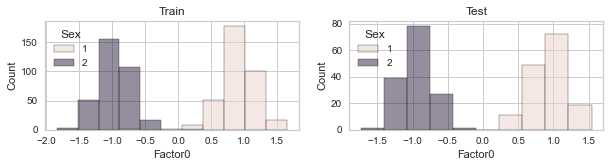

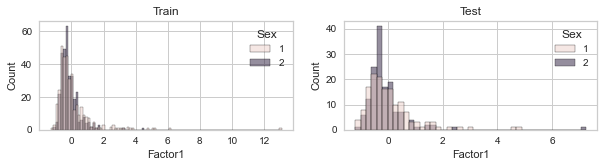

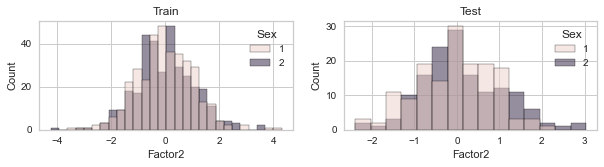

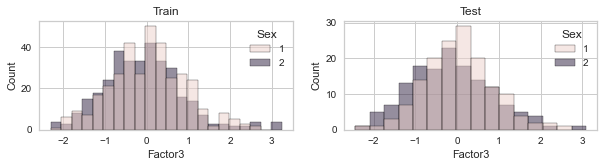

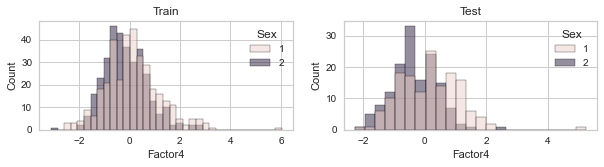

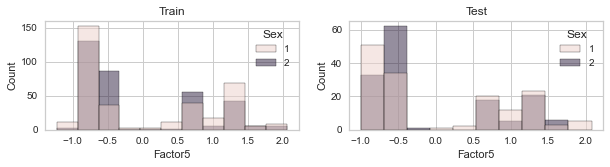

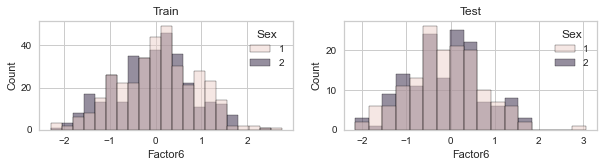

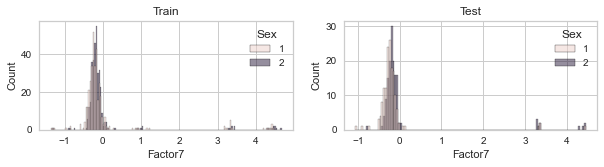

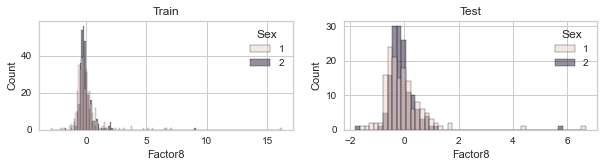

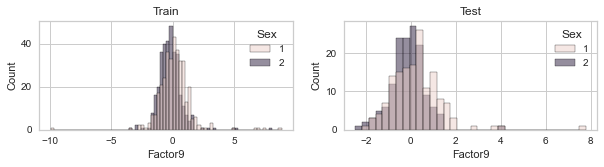

In [54]:
# 성별에 따른 주성분의 분포 분류 차이 확인
X_train, X_test = train_test_split(df, train_size=0.7, random_state=123)
X_train_fadesc = pd.concat([X_train['Sex'].reset_index().iloc[:,1:], X_train_fa], axis=1)
X_test_fadesc = pd.concat([X_test['Sex'].reset_index().iloc[:,1:], X_test_fa], axis=1)

for col in X_train_fadesc.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=X_train_fadesc, x=col, hue='Sex', ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=X_test_fadesc, x=col, hue='Sex', ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

# **Real Data Analysis:** Face Image Classification

## `Data Preprocessing`
- 2000년 초반 이후의 정치인, 가수, 배우, 운동선수 등의 얼굴 이미지

얼굴 이미지 갯수:  34
데이터의 크기:  (2370, 112, 84)


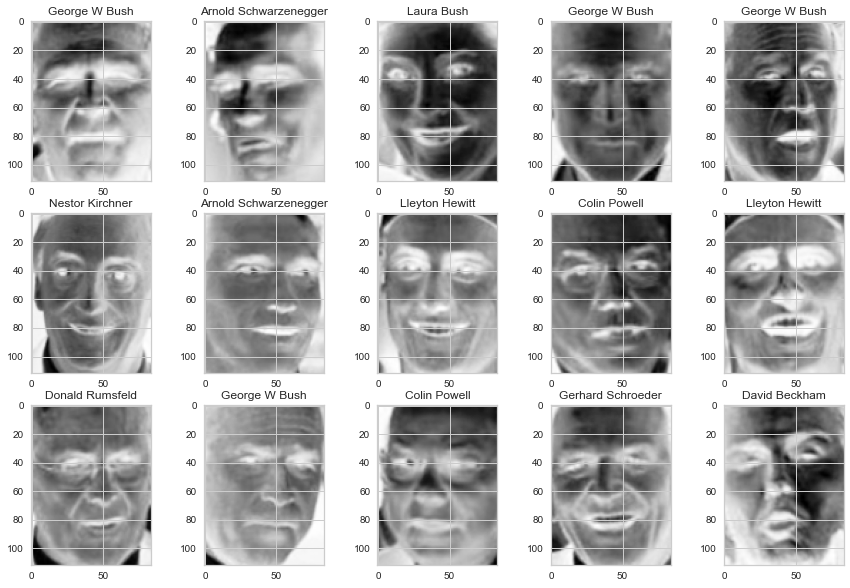

In [55]:
# 데이터 로딩
people = fetch_lfw_people(min_faces_per_person=30, resize=0.9)

# 데이터 크기(차원) 및 레이블 확인
print('얼굴 이미지 갯수: ', len(people.target_names))
print('데이터의 크기: ', people.images.shape)

# 얼굴 이미지 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(people.target, people.images, axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

In [56]:
# 각 사람마다 동일하게 10개의 이미지만 추출하여 학습데이터 구성
# 최종 종속변수 및 독립변수 크기 확인
depth = np.zeros(people.target.shape, dtype=np.bool)
for target in np.unique(people.target):
    depth[np.where(people.target==target)[0][:10]] = 1
    
X = people.data[depth]
Y = people.target[depth]
X.shape, Y.shape

((340, 9408), (340,))

In [57]:
# 데이터분리 및 스케일링
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state=123)
X_train = X_train / 255.
X_test = X_test / 255.

## K-means Clustering

In [58]:
# 모델링
model_kmeans = KMeans(n_clusters=len(np.unique(Y_train)), random_state=123)
model_kmeans.fit(X_train, Y_train)
Y_trpred = model_kmeans.predict(X_train)
Y_tepred = model_kmeans.predict(X_test)

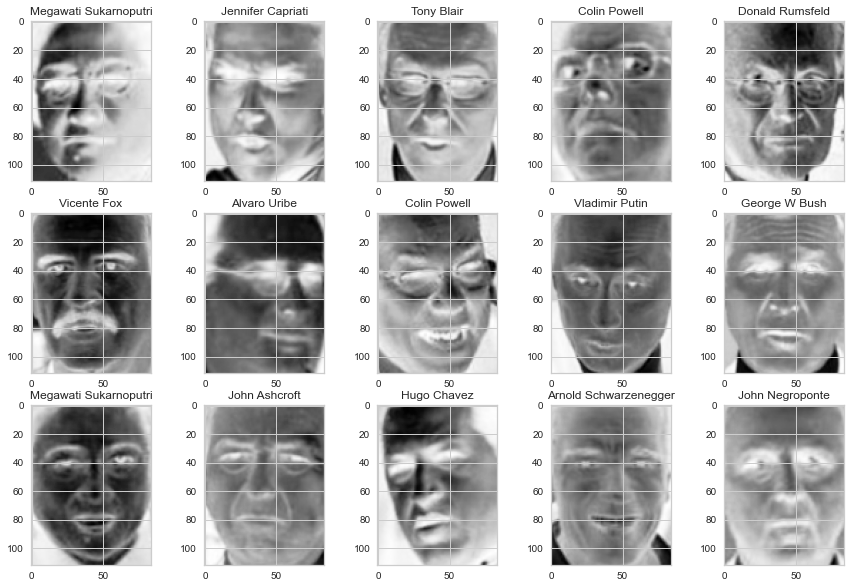

In [59]:
# 얼굴 이미지 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(Y_train, 
                             X_train.reshape(-1,people.images.shape[1],people.images.shape[2]), 
                             axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

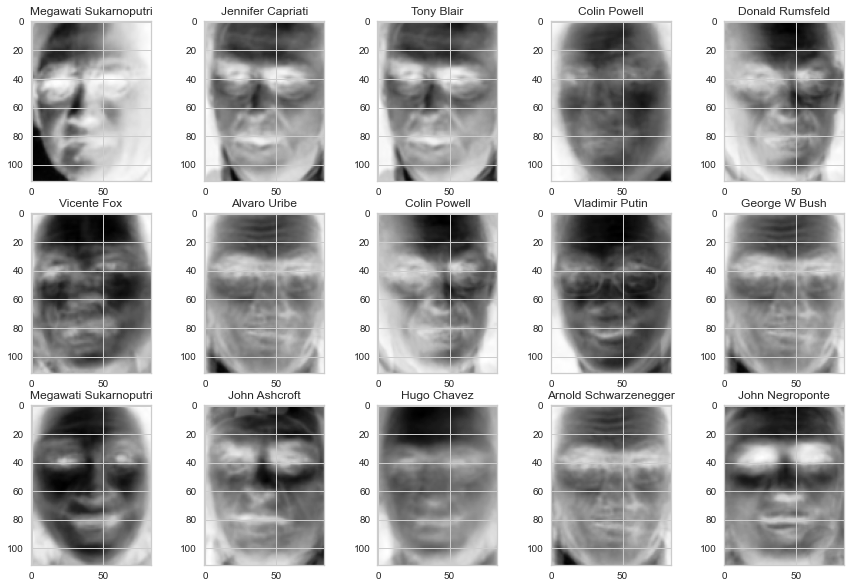

In [60]:
# 주성분으로 얼굴 이미지 복원 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(Y_train, 
                             model_kmeans.cluster_centers_[Y_trpred].reshape(-1,people.images.shape[1],people.images.shape[2]),
                             axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

## Principal Component Analysis

In [61]:
# 데이터의 주성분 추출
model_pca = PCA(n_components=50, random_state=123)
model_pca.fit(X_train)

PCA(n_components=50, random_state=123)

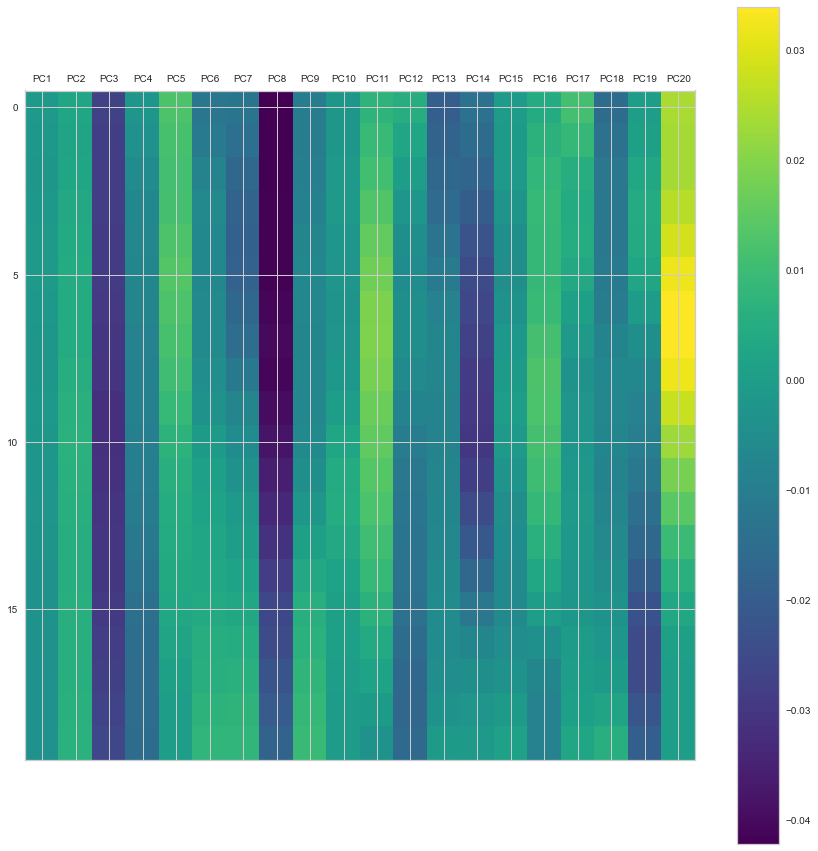

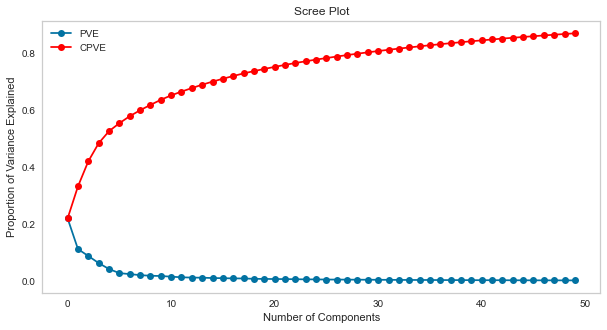

In [62]:
# 고유벡터 시각화 및 변수별 이해
n_pc = 20
plt.figure(figsize=(15,15))
plt.matshow(model_pca.components_.T[:20,:n_pc], cmap='viridis', fignum=1)
colnames = ['PC'+str(i) for i in range(1, n_pc+1)]
plt.xticks([i for i in range(n_pc)], colnames)
plt.colorbar()
plt.show()

# Scree Plot
plt.figure(figsize=(10,5))
plt.plot(model_pca.explained_variance_ratio_, 'o-', label='PVE')
plt.plot(model_pca.explained_variance_ratio_.cumsum(), 'o-', c='red', label='CPVE')
plt.legend()
plt.title('Scree Plot')
plt.xlabel('Number of Components')
plt.ylabel('Proportion of Variance Explained')
plt.grid()
plt.show()

In [63]:
# 최적 주성분 갯수
n_optpc = (model_pca.explained_variance_ratio_.cumsum() < 0.8).sum()
n_optpc

30

In [64]:
# 데이터의 주성분 추출
model_pca = PCA(n_components=n_optpc, random_state=123)
model_pca.fit(X_train)
X_train_pca = model_pca.transform(X_train)
X_test_pca = model_pca.transform(X_test)

In [65]:
# 주성분 데이터 정리
colnames = ['PC'+str(i) for i in range(1, X_train_pca.shape[1]+1)]
X_train_pca = pd.DataFrame(X_train_pca, columns=colnames)
X_test_pca = pd.DataFrame(X_test_pca, columns=colnames)

In [66]:
# 데이터의 분포 통계량 확인
X_train_pca.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
count,255.00,255.00,255.00,255.00,255.00,255.00,255.00,255.00,255.00,255.00,...,255.00,255.00,255.00,255.00,255.00,255.00,255.00,255.00,255.00,255.00
mean,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,...,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00
std,7.28,5.20,4.61,3.91,3.19,2.60,2.43,2.25,2.12,2.08,...,1.32,1.30,1.26,1.20,1.20,1.14,1.13,1.10,1.08,1.06
min,-17.55,-11.74,-10.22,-9.51,-9.96,-7.35,-7.50,-6.34,-5.98,-6.04,...,-3.02,-3.75,-3.68,-4.43,-3.15,-3.88,-3.14,-3.33,-3.43,-2.97
25%,-4.98,-3.33,-3.27,-2.62,-1.91,-1.78,-1.76,-1.53,-1.45,-1.49,...,-0.91,-0.81,-0.80,-0.70,-0.78,-0.63,-0.66,-0.69,-0.64,-0.78
50%,-0.10,-0.05,-0.18,-0.07,-0.04,-0.00,-0.28,-0.24,0.02,-0.11,...,-0.10,-0.05,0.06,0.06,0.07,0.06,-0.02,-0.10,-0.02,0.04
75%,5.12,2.94,3.48,2.40,1.90,1.65,1.48,1.34,1.54,1.32,...,0.84,0.79,0.79,0.74,0.75,0.72,0.64,0.72,0.56,0.63
max,21.20,15.90,12.13,12.17,12.20,7.81,8.88,7.40,8.18,7.18,...,4.30,4.86,4.61,5.14,3.57,4.44,4.17,4.36,4.60,3.16


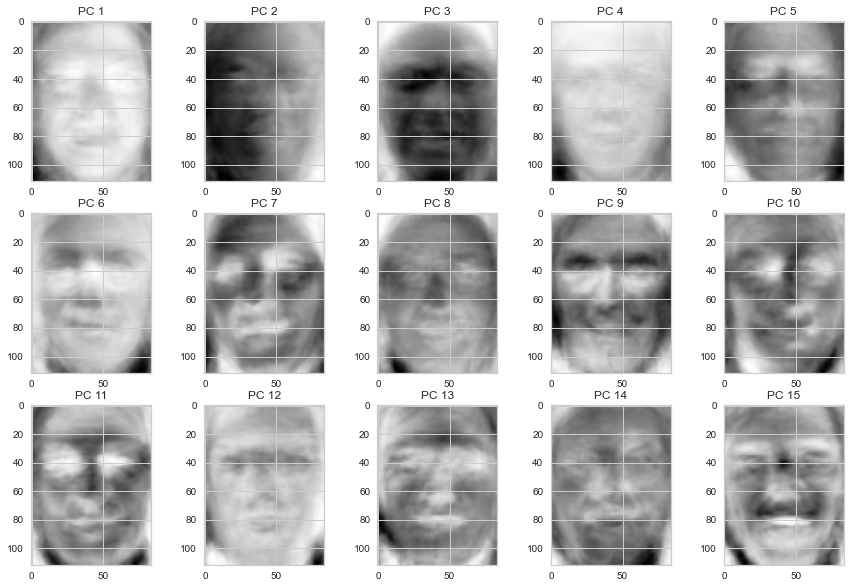

In [67]:
# 주성분 별 얼굴이미지 패턴
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for i, (component, ax) in enumerate(zip(model_pca.components_, axes.ravel())):
    ax.imshow(component.reshape(people.images[0].shape))
    ax.set_title("PC {}".format(i+1))
plt.show()

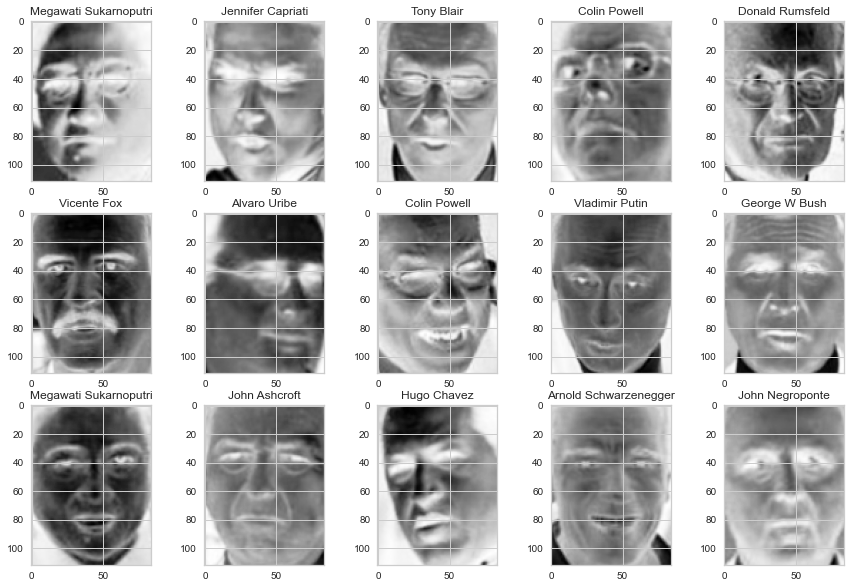

In [68]:
# 얼굴 이미지 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(Y_train, 
                             X_train.reshape(-1,people.images.shape[1],people.images.shape[2]), 
                             axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

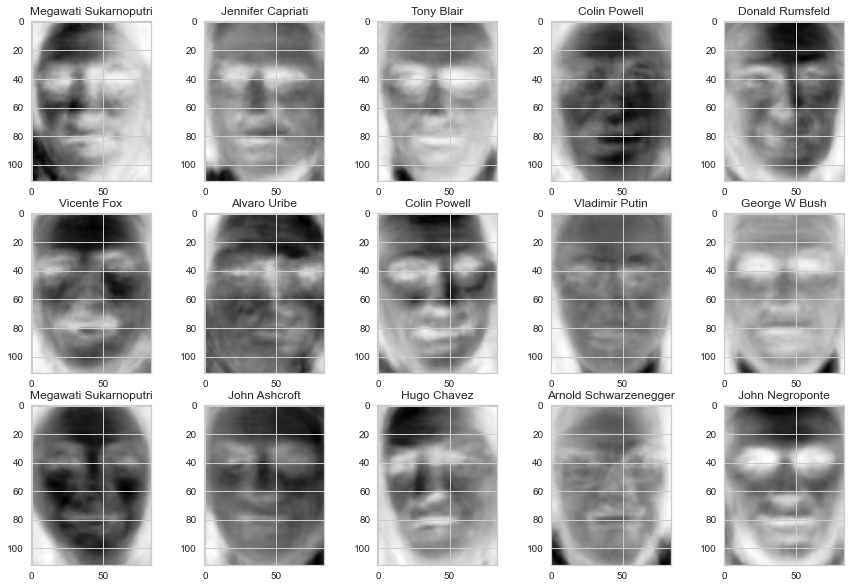

In [69]:
# 주성분으로 얼굴 이미지 복원 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(Y_train, 
                             model_pca.inverse_transform(X_train_pca).reshape(-1,people.images.shape[1],people.images.shape[2]),
                             axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

## Non-negative Matrix Factorization

In [70]:
# 모델링
n_factor = 50
model_nmf = NMF(n_components=n_factor, random_state=123)
model_nmf.fit(X_train)
X_train_nmf = model_nmf.transform(X_train)
X_test_nmf = model_nmf.transform(X_test)

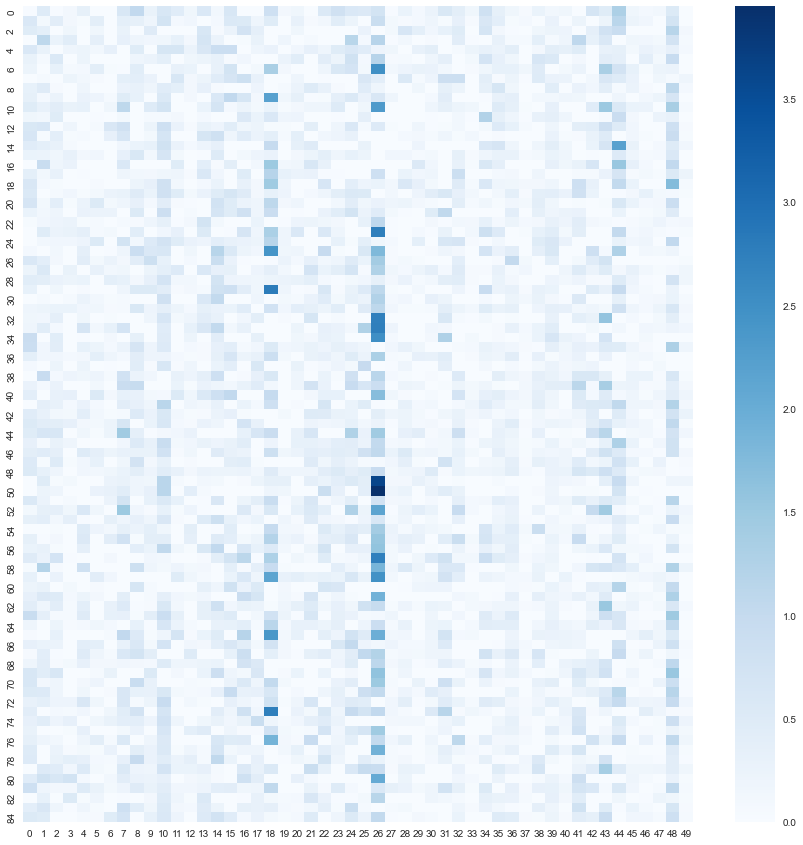

In [71]:
# Test 가중치 행렬 W 시각화
plt.figure(figsize=(15,15))
sns.heatmap(X_test_nmf, cmap='Blues', annot=False, fmt='.2f')
plt.show()

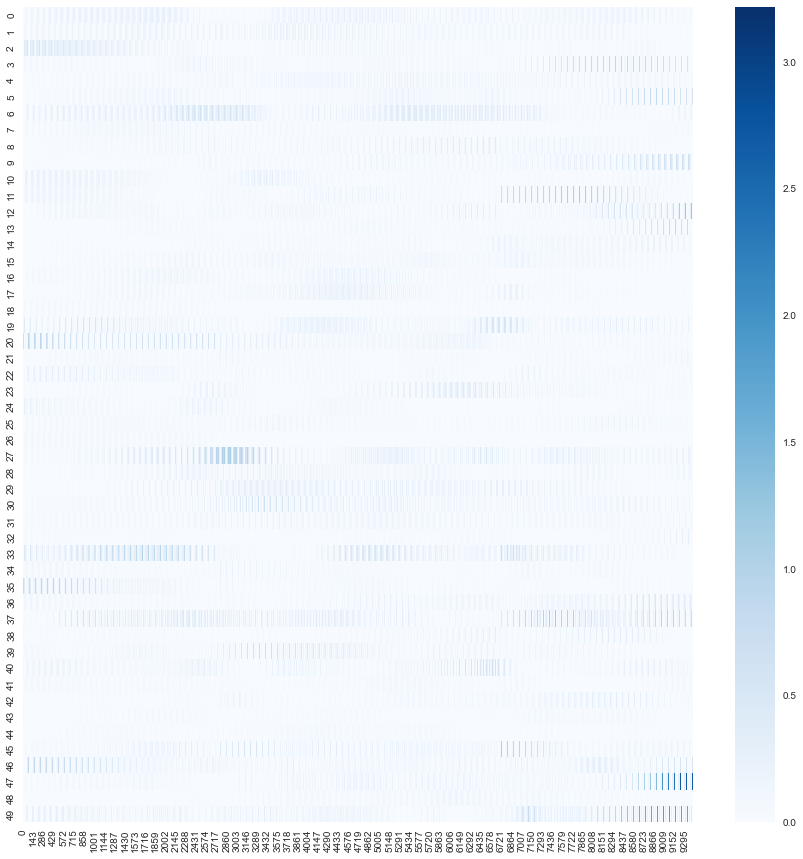

In [72]:
# 특성 행렬 H 시각화
plt.figure(figsize=(15,15))
sns.heatmap(model_nmf.components_, cmap='Blues', annot=False, fmt='.2f')
plt.show()

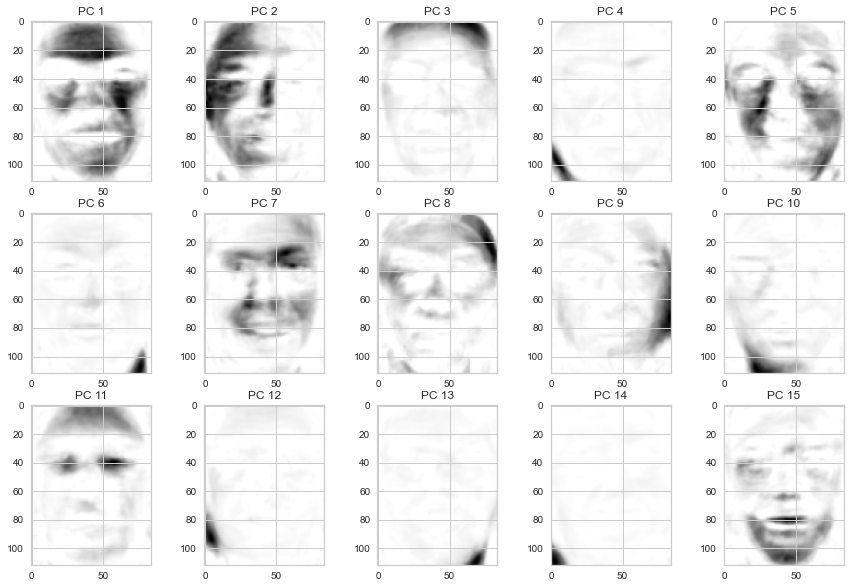

In [73]:
# 주성분 별 얼굴이미지 패턴
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for i, (component, ax) in enumerate(zip(model_nmf.components_, axes.ravel())):
    ax.imshow(component.reshape(people.images[0].shape))
    ax.set_title("PC {}".format(i+1))
plt.show()

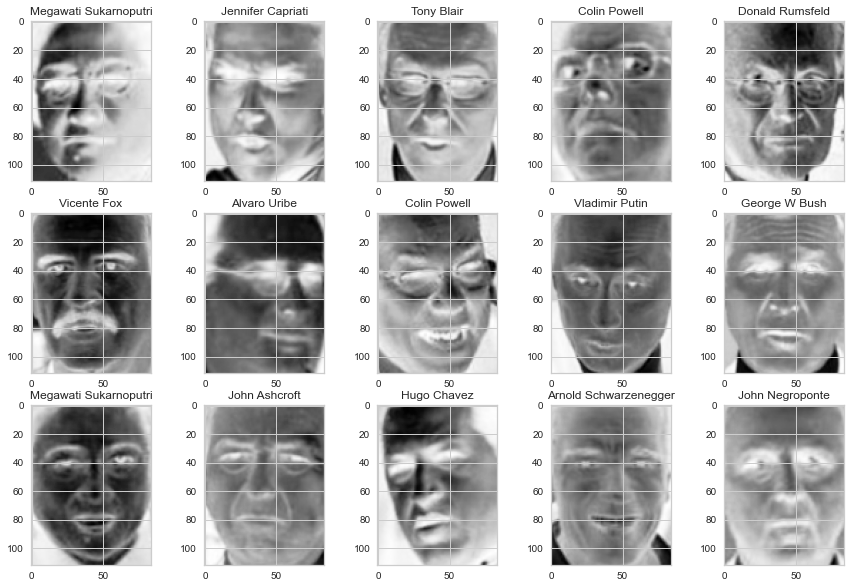

In [74]:
# 얼굴 이미지 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(Y_train, 
                             X_train.reshape(-1,people.images.shape[1],people.images.shape[2]), 
                             axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

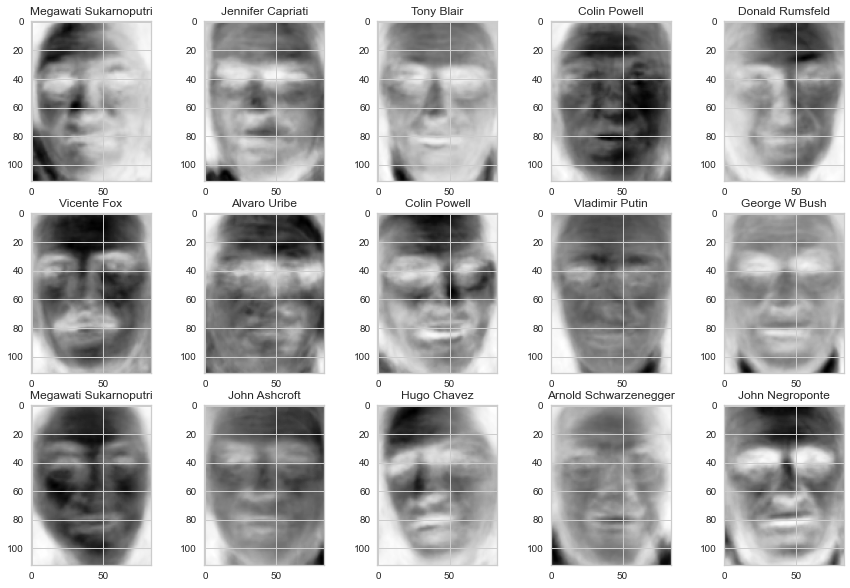

In [75]:
# 주성분으로 얼굴 이미지 복원 시각화
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(Y_train, 
                             model_nmf.inverse_transform(X_train_nmf).reshape(-1,people.images.shape[1],people.images.shape[2]),
                             axes.ravel()):
    ax.imshow(image)
    ax.set_title(people.target_names[target])
plt.show()

## PCA vs NMF

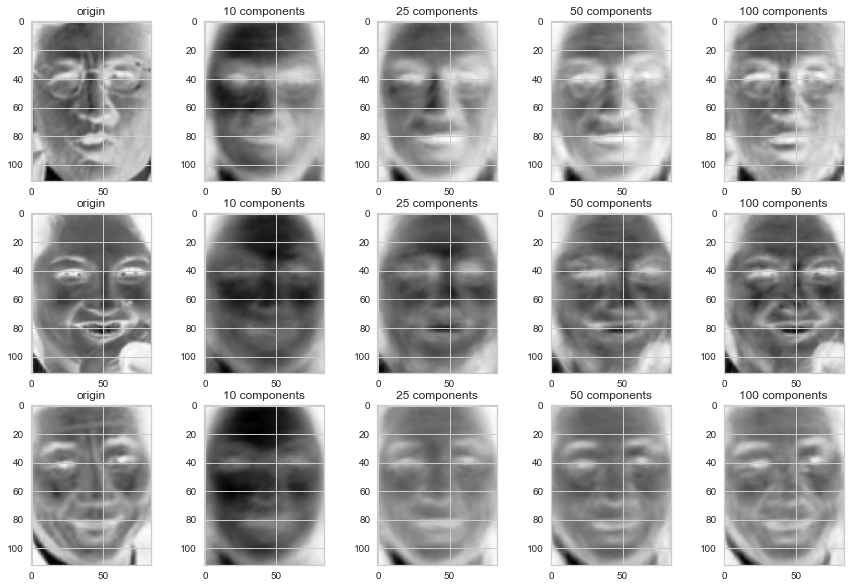

In [76]:
# 주성분 갯수 증가에 따른 얼굴 이미지 복원 정도
n_target = 3
n_pclist = [10, 25, 50, 100]
target_sample = random.sample(range(X_train.shape[0]), n_target)
images = X_train.reshape(-1,people.images.shape[1],people.images.shape[2])[target_sample,:,:]
for n in n_pclist:
    ## 학습
    model_pca = PCA(n_components=n, random_state=123)
    model_pca.fit(X_train)
    ## 변환 및 역변환
    X_train_pca = model_pca.transform(X_train)
    X_train_invpca = model_pca.inverse_transform(X_train_pca)
    X_train_invpca = X_train_invpca.reshape(-1,people.images.shape[1],people.images.shape[2])
    images = np.append(images, X_train_invpca[target_sample,:,:], axis=0)

# 얼굴 이미지 복원 시각화
title_list = np.ravel([['origin'] + [str(i) + ' components' for i in n_pclist]]*5)
target_num = np.ravel([[i]*5 for i in Y_train[target_sample]])
target_image = [i+n_target*j-1 for i in range(1,n_target+1) for j in range(5)]
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(title_list, images[target_image,:,:], axes.ravel()):
    ax.imshow(image)
    ax.set_title(target)
plt.show()

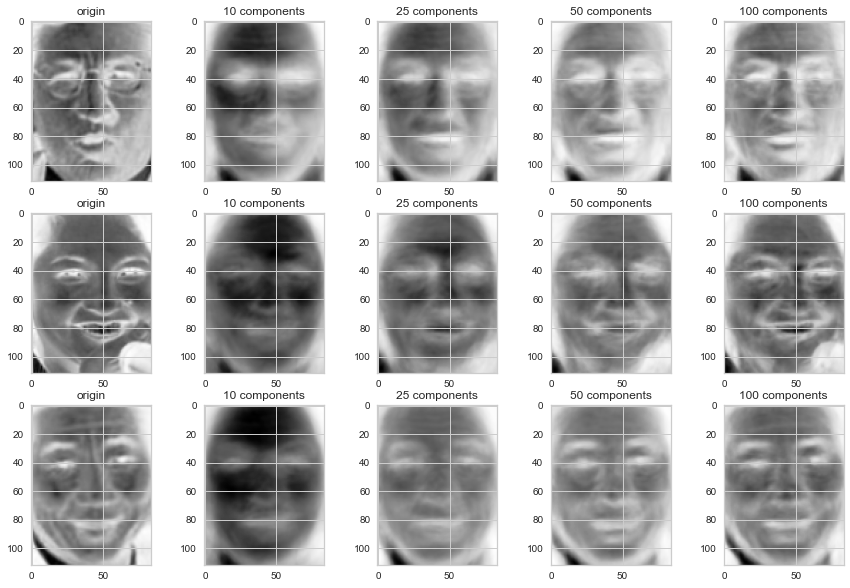

In [77]:
# 주성분 갯수 증가에 따른 얼굴 이미지 복원 정도
n_target = 3
n_pclist = [10, 25, 50, 100]
images = X_train.reshape(-1,people.images.shape[1],people.images.shape[2])[target_sample,:,:]
for n in n_pclist:
    ## 학습
    model_nmf = NMF(n_components=n, random_state=123)
    model_nmf.fit(X_train)
    ## 변환 및 역변환
    X_train_nmf = model_nmf.transform(X_train)
    X_train_invnmf = model_nmf.inverse_transform(X_train_nmf)
    X_train_invnmf = X_train_invnmf.reshape(-1,people.images.shape[1],people.images.shape[2])
    images = np.append(images, X_train_invnmf[target_sample,:,:], axis=0)

# 얼굴 이미지 복원 시각화
title_list = np.ravel([['origin'] + [str(i) + ' components' for i in n_pclist]]*5)
target_num = np.ravel([[i]*5 for i in Y_train[target_sample]])
target_image = [i+n_target*j-1 for i in range(1,n_target+1) for j in range(5)]
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for target, image, ax in zip(title_list, images[target_image,:,:], axes.ravel()):
    ax.imshow(image)
    ax.set_title(target)
plt.show()

- `PCA`는 데이터 재구성을 위해 최선인 패턴 추출하는 반면, `NMF`는 유용한 패턴 추출
- 재구성을 위해선 `PCA`, 주요 요인을 찾기 위해선 `NMF`

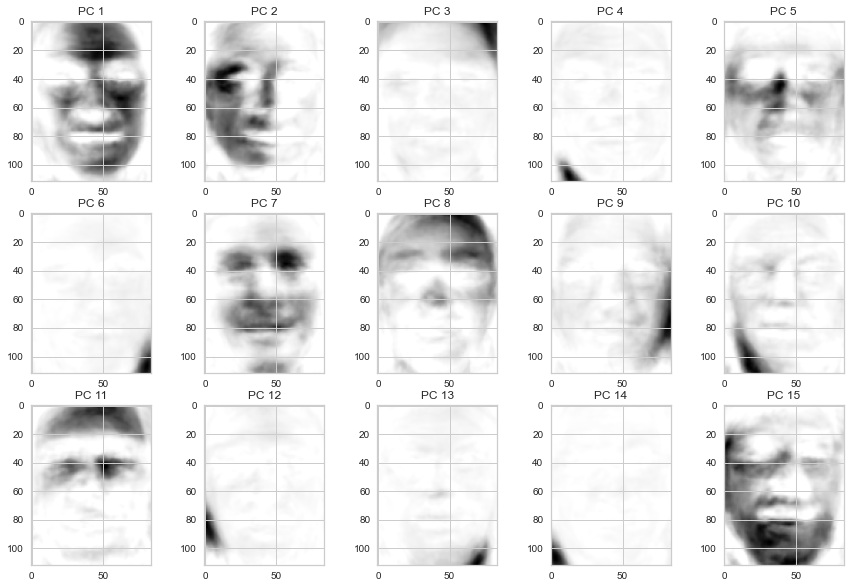

In [78]:
# 모델링
n_factor = 20
model_nmf = NMF(n_components=n_factor, random_state=123)
model_nmf.fit(X_train)
X_train_nmf = model_nmf.transform(X_train)
X_test_nmf = model_nmf.transform(X_test)

# 주성분 별 얼굴이미지 패턴
fig, axes = plt.subplots(3, 5, figsize=(15,10))
for i, (component, ax) in enumerate(zip(model_nmf.components_, axes.ravel())):
    ax.imshow(component.reshape(people.images[0].shape))
    ax.set_title("PC {}".format(i+1))
plt.show()

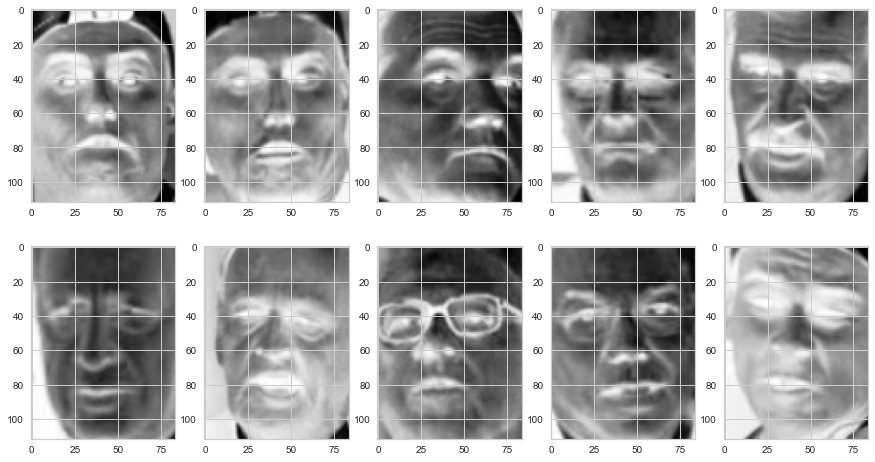

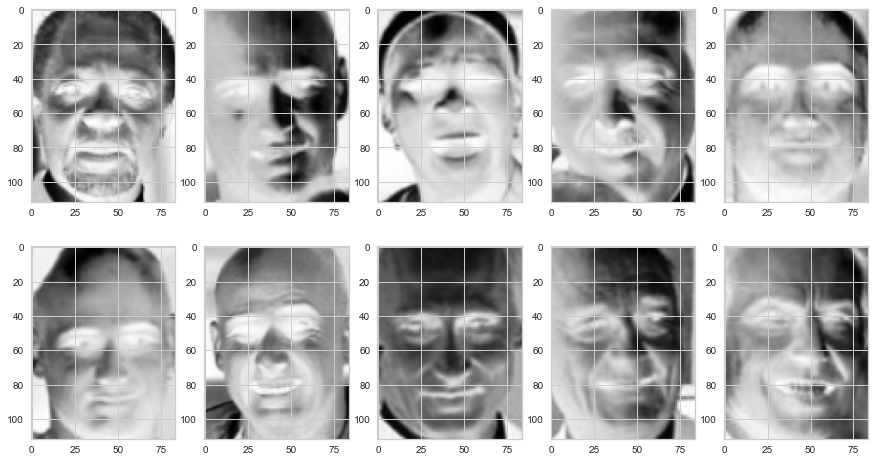

In [79]:
# 주성분이 강조된 샘플 추출
component = 2
target_image_idx = np.argsort(X_train_nmf[:,component])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15,8))
images = X_train.reshape(-1,people.images.shape[1],people.images.shape[2])
for image, ax in zip(images[target_image_idx,:,:], axes.ravel()):
    ax.imshow(image)
plt.show()

component = 7
target_image_idx = np.argsort(X_train_nmf[:,component])[::-1]
fig, axes = plt.subplots(2, 5, figsize=(15,8))
images = X_train.reshape(-1,people.images.shape[1],people.images.shape[2])
for image, ax in zip(images[target_image_idx,:,:], axes.ravel()):
    ax.imshow(image)
plt.show()

# **Real Data Analysis:** Time Series Decomposition

## PCA vs NMF

(2000, 3)


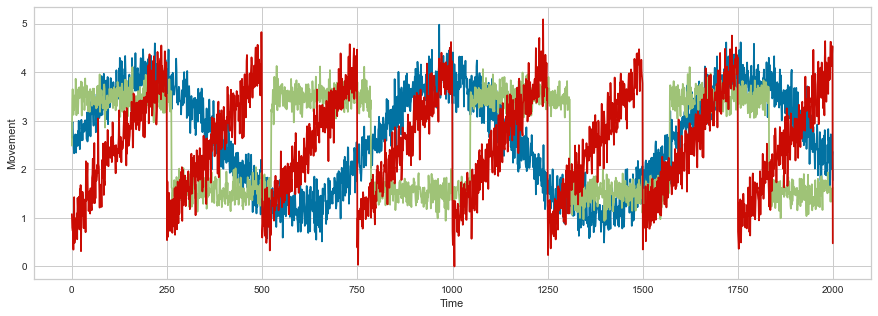

In [80]:
# 데이터 로딩
ts = make_signals()
print(ts.shape)
plt.figure(figsize=(15,5))
plt.plot(ts)
plt.xlabel('Time')
plt.ylabel('Movement')
plt.show()

(2000, 100)


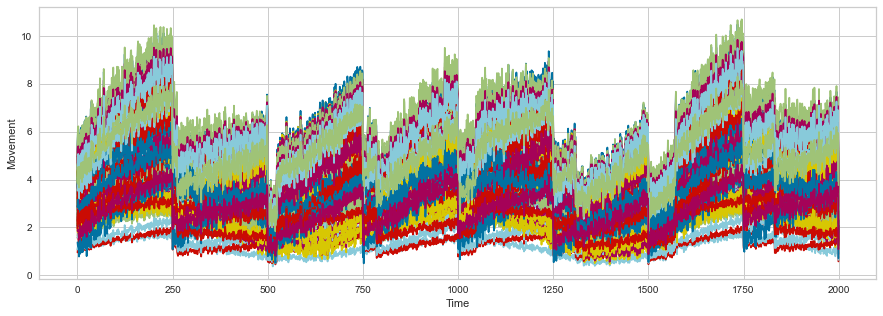

In [81]:
# 오류가 있는 100개의 장비로 원본 ts를 추정한 데이터
weight = np.random.RandomState(123).uniform(size=(3,100))
X_sensor = np.dot(ts, weight)
print(X_sensor.shape)
plt.figure(figsize=(15,5))
plt.plot(X_sensor)
plt.xlabel('Time')
plt.ylabel('Movement')
plt.show()

In [82]:
# PCA & NMF 모델링
n_pc = ts.shape[1]
model_pca = PCA(n_components=n_pc, random_state=123)
X_pca = model_pca.fit_transform(X_sensor)
model_nmf = NMF(n_components=n_pc, random_state=123)
X_nmf = model_nmf.fit_transform(X_sensor)
print(X_pca.shape, X_nmf.shape)

(2000, 3) (2000, 3)


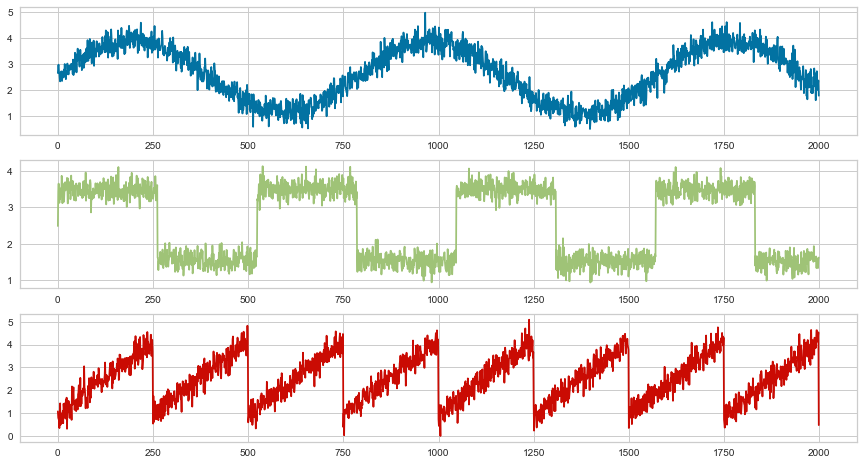

In [83]:
# 원본 데이터 분해
colors = ['b', 'g', 'r']
fig, axes = plt.subplots(3, 1, figsize=(15,8))
for ts_each, ax, color in zip(ts.T, axes.ravel(), colors):
    ax.plot(ts_each, color=color)
plt.show()

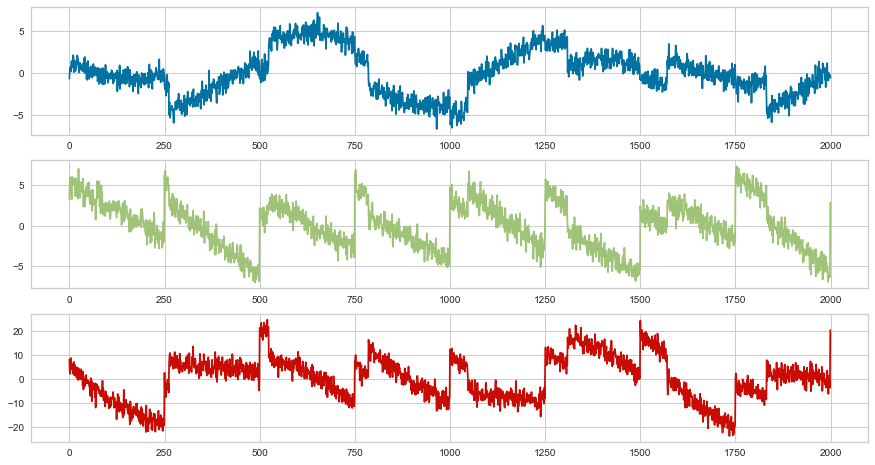

In [84]:
# PCA로 데이터 분해 추출
colors = ['b', 'g', 'r']
fig, axes = plt.subplots(3, 1, figsize=(15,8))
for ts_each, ax, color in zip(np.array([list(reversed(i)) for i in X_pca]).T, 
                              axes.ravel(), colors):
    ax.plot(ts_each, color=color)
plt.show()

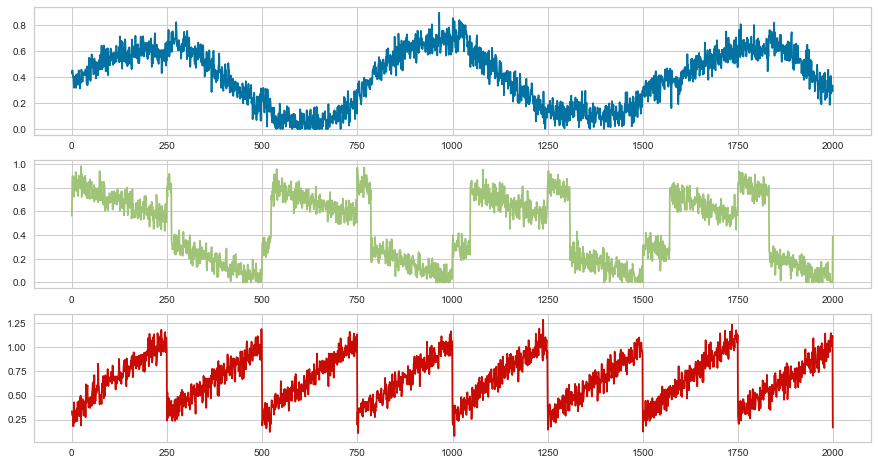

In [85]:
# NMF로 데이터 분해 추출
colors = ['b', 'g', 'r']
fig, axes = plt.subplots(3, 1, figsize=(15,8))
for ts_each, ax, color in zip(np.array([list(reversed(i)) for i in X_nmf]).T, 
                              axes.ravel(), colors):
    ax.plot(ts_each, color=color)
plt.show()

- `NMF`는 원본 시계열을 잘 복원했지만 `PCA`는 첫번재 주성분의 대부분의 변동을 표현
- 데이터를 `일정 성분의 합으로 분해`하는 알고리즘으로 `ICA(독립성분분석)`, `Sparse Coding(희소분석)` 등이 있음

# **Real Data Analysis:** Online Shopping

| **변수명** 	| **설명** 	|
|:---:	|:---:	|
| **Year** 	| 2008 	|
| **Month** 	| from April (4) to August (8) 	|
| **Day** 	| day number of the month 	|
| **Order** 	| sequence of clicks during one session 	|
| **Country** 	| 1-Australia 2-Austria 3-Belgium 4-British Virgin Islands 5-Cayman Islands 	|
|  	| 6-Christmas Island 7-Croatia 8-Cyprus 9-Czech Republic 10-Denmark 	|
|  	| 11-Estonia 12-unidentified 13-Faroe Islands 14-Finland 15-France 	|
|  	| 16-Germany 17-Greece 18-Hungary 19-Iceland 20-India 	|
|  	| 21-Ireland 22-Italy 23-Latvia 24-Lithuania 25-Luxembourg 	|
|  	| 26-Mexico 27-Netherlands 28-Norway 29-Poland 30-Portugal 	|
|  	| 31-Romania 32-Russia 33-San Marino 34-Slovakia 35-Slovenia 	|
|  	| 36-Spain 37-Sweden 38-Switzerland 39-Ukraine 40-United Arab Emirates 	|
|  	| 41-United Kingdom 42-USA 43-biz (*.biz) 44-com (*.com) 45-int (*.int) 	|
|  	| 46-net (*.net) 47-org (*.org) 	|
| **Session ID** 	| variable indicating session id 	|
| **Page** 	| page number within the e-store website 	|
| **Category** 	| concerns the main product category 	|
|  	| 1-trousers, 2-skirts, 3-blouses, 4-sale 	|
| **Category-Model** 	| contains information about the code for each product 	|
| **Colour** 	| colour of product 	|
|  	| 1-beige, 2-black, 3-blue, 4-brown, 5-burgundy 	|
|  	| 6-gray, 7-green, 8-navy blue, 9-of many colors, 10-olive 	|
|  	| 11-pink, 12-red, 13-violet, 14-white 	|
| **Location** 	| photo location on the page 	|
|  	| 1-top left, 2-top in the middle, 3-top right 	|
|  	| 4-bottom left, 5-bottom in the middle, 6-bottom right 	|
| **Model Photography** 	| 1-En Face, 2-Profile 	|
| **Price** 	| price in US dollars 	|

## `Data Preprocessing`

In [86]:
# 데이터 로딩
df = pd.read_csv(os.path.join('.', 'Data', 'OnlineShopping', 'online_shopping.csv'))
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Year,"165,474.00",NaN,NaN,NaN,"2,020.00",0.00,"2,020.00","2,020.00","2,020.00","2,020.00","2,020.00"
Month,"165,474.00",NaN,NaN,NaN,5.59,1.33,4.00,4.00,5.00,7.00,8.00
Day,"165,474.00",NaN,NaN,NaN,14.52,8.83,1.00,7.00,14.00,22.00,31.00
Order,"165,474.00",NaN,NaN,NaN,9.82,13.48,1.00,2.00,6.00,12.00,195.00
Country,"165,474.00",NaN,NaN,NaN,26.95,7.15,1.00,29.00,29.00,29.00,47.00
Session ID,"165,474.00",NaN,NaN,NaN,"12,058.42","7,008.42",1.00,"5,931.00","11,967.50","18,219.00","24,026.00"
Page,"165,474.00",NaN,NaN,NaN,1.71,0.98,1.00,1.00,1.00,2.00,5.00
Category,"165,474.00",NaN,NaN,NaN,2.40,1.14,1.00,1.00,2.00,3.00,4.00
Category-Model,165474,217,B4,3579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Colour,"165,474.00",NaN,NaN,NaN,6.23,4.24,1.00,3.00,4.00,9.00,14.00


In [87]:
# 카테고리 변수의 문자 변환
colname_category = ['Year', 'Month', 'Day', 'Country', 'Session ID', 'Page', 
                    'Category', 'Category-Model', 'Colour', 'Location', 'Model Photography']
df[colname_category] = df[colname_category].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165474 entries, 0 to 165473
Data columns (total 13 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Year               165474 non-null  object
 1   Month              165474 non-null  object
 2   Day                165474 non-null  object
 3   Order              165474 non-null  int64 
 4   Country            165474 non-null  object
 5   Session ID         165474 non-null  object
 6   Page               165474 non-null  object
 7   Category           165474 non-null  object
 8   Category-Model     165474 non-null  object
 9   Colour             165474 non-null  object
 10  Location           165474 non-null  object
 11  Model Photography  165474 non-null  object
 12  Price              165474 non-null  int64 
dtypes: int64(2), object(11)
memory usage: 16.4+ MB


In [88]:
# 상품 별 정보 생성
from scipy.stats import mode
feature_logic = {'Month': [('Sales_TopM', lambda x: mode(x)[0][0])],
                 'Day': [('Sales_TopD', lambda x: mode(x)[0][0])],
                 'Price': [('Price_Mean','mean')],
                 'Order': [('Order_Min','min'),  ('Order_Median','median'), ('Order_Max','max')],
                 'Session ID': [('Session_Click',pd.Series.nunique)],
                 'Page': [('Page_Click', lambda x: mode(x)[0][0])],
                 'Colour': [('Colour_Top', lambda x: mode(x)[0][0])],
                 'Location': [('Location_Top', lambda x: mode(x)[0][0])],
                 'Model Photography': [('Photography_Top', lambda x: mode(x)[0][0])]}
df_product = df.groupby(by=['Country', 'Category', 'Category-Model']).agg(feature_logic)
display(df_product)
df_product.columns = df_product.columns.droplevel(0)
df_product.describe(include='all').T

Month        Day      Price     Order  \
                                Sales_TopM Sales_TopD Price_Mean Order_Min   
Country Category Category-Model                                              
1       3        C30                     6         11      28.00         2   
        4        P17                     6         11      38.00         1   
10      1        A1                      4          8      28.00         2   
                 A11                     4         22      62.00         1   
                 A12                     7         12      38.00         1   
...                                    ...        ...        ...       ...   
9       4        P77                     6          6      43.00        18   
                 P78                     5         17      48.00         1   
                 P80                     7         17      28.00        96   
                 P82                     5         20      48.00        17   
                 P9                      4          1      23.00         1   

                                                          Session ID  \
                                Order_Median Order_Max Session_Click   
Country Category Category-Model                                        
1       3        C30                    2.00         2             1   
        4        P17                    2.00         3             1   
10      1        A1                     2.00         2             1   
                 A11                    2.00         3             2   
                 A12                    3.00         5             5   
...                                      ...       ...           ...   
9       4        P77                   18.00        18             1   
                 P78                    6.50        95             3   
                 P80                   96.00        96             1   
                 P82                   17.50        18             2   
                 P9                     3.00         4             4   

                                      Page     Colour     Location  \
                                Page_Click Colour_Top Location_Top   
Country Category Category-Model                                      
1       3        C30                     2          2            4   
        4        P17                     1          2            6   
10      1        A1                      1          8            1   
                 A11                     1          3            4   
                 A12                     1          2            4   
...                                    ...        ...          ...   
9       4        P77                     5          7            2   
                 P78                     5         14            2   
                 P80                     5          7            3   
                 P82                     5          6            4   
                 P9                      1          4            3   

                                Model Photography  
                                  Photography_Top  
Country Category Category-Model                    
1       3        C30                            2  
        4        P17                            2  
10      1        A1                             1  
                 A11                            1  
                 A12                            1  
...                                           ...  
9       4        P77                            1  
                 P78                            2  
                 P80                            1  
                 P82                            2  
                 P9                             2  

[3141 rows x 11 columns]

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Sales_TopM,3141,5,4,1193,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sales_TopD,3141,31,12,250,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Price_Mean,"3,141.00",NaN,NaN,NaN,42.43,12.05,18.00,33.00,43.00,48.00,82.00
Order_Min,"3,141.00",NaN,NaN,NaN,6.28,9.60,1.00,1.00,3.00,7.00,96.00
Order_Median,"3,141.00",NaN,NaN,NaN,10.00,10.20,1.00,4.00,7.00,12.00,96.00
Order_Max,"3,141.00",NaN,NaN,NaN,31.64,40.06,1.00,7.00,17.00,35.00,195.00
Session_Click,"3,141.00",NaN,NaN,NaN,47.23,181.86,1.00,1.00,2.00,6.00,"2,649.00"
Page_Click,3141,5,1,1302,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Colour_Top,3141,14,2,617,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location_Top,3141,6,1,636,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
# 데이터분리
Y_colname = ['Category']
X_colname = [col for col in df_product.columns if col not in Y_colname]
if Y_colname[0] not in df_product.columns:
    df_product.reset_index(inplace=True)
    del df_product['Category-Model']
    del df_product['Country']
df_product[Y_colname] = df_product[Y_colname].astype(int)-1
display(df_product)

X_train, X_test, Y_train, Y_test = train_test_split(df_product[X_colname], df_product[Y_colname], 
                                                    train_size=0.7, random_state=123)
X_train.describe(include='all').T

,Category,Sales_TopM,Sales_TopD,Price_Mean,Order_Min,Order_Median,Order_Max,Session_Click,Page_Click,Colour_Top,Location_Top,Photography_Top
0,2,6,11,28.00,2,2.00,2,1,2,2,4,2
1,3,6,11,38.00,1,2.00,3,1,1,2,6,2
2,0,4,8,28.00,2,2.00,2,1,1,8,1,1
3,0,4,22,62.00,1,2.00,3,2,1,3,4,1
4,0,7,12,38.00,1,3.00,5,5,1,2,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3136,3,6,6,43.00,18,18.00,18,1,5,7,2,1
3137,3,5,17,48.00,1,6.50,95,3,5,14,2,2
3138,3,7,17,28.00,96,96.00,96,1,5,7,3,1
3139,3,5,20,48.00,17,17.50,18,2,5,6,4,2


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Sales_TopM,2198,5,4,837,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Sales_TopD,2198,31,12,178,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Price_Mean,"2,198.00",NaN,NaN,NaN,42.23,12.07,18.00,33.00,38.00,48.00,82.00
Order_Min,"2,198.00",NaN,NaN,NaN,6.11,9.36,1.00,1.00,2.00,7.00,89.00
Order_Median,"2,198.00",NaN,NaN,NaN,9.88,10.02,1.00,4.00,7.00,12.00,89.00
Order_Max,"2,198.00",NaN,NaN,NaN,31.81,40.04,1.00,7.00,17.00,36.00,195.00
Session_Click,"2,198.00",NaN,NaN,NaN,46.69,181.36,1.00,1.00,2.00,6.00,"2,649.00"
Page_Click,2198,5,1,918,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Colour_Top,2198,14,2,416,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location_Top,2198,6,2,442,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
# # 카테고리 변수의 더미변수 생성
# # 샘플의 수가 적어서 Dummy 변수 생성은 미실행
# colname_category = list(X_train.columns[X_train.describe(include='all').T['unique'] < 10])
# X_train = pd.get_dummies(X_train, drop_first=True)
# X_test = pd.get_dummies(X_test, drop_first=True)
# pd.DataFrame(X_test).describe().T

In [91]:
# 스케일링
X_colname = X_train.columns
scaler = preprocessing.StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
pd.DataFrame(X_test, columns=X_colname).describe().T

,count,mean,std,min,25%,50%,75%,max
Sales_TopM,943.00,0.00,1.00,-1.02,-1.02,-0.22,0.58,2.18
Sales_TopD,943.00,-0.00,1.00,-1.44,-0.78,-0.11,0.73,2.18
Price_Mean,943.00,0.00,1.00,-2.08,-0.83,0.01,0.76,3.26
Order_Min,943.00,-0.00,1.00,-0.56,-0.56,-0.36,0.13,8.82
Order_Median,943.00,0.00,1.00,-0.88,-0.59,-0.31,0.23,8.10
Order_Max,943.00,-0.00,1.00,-0.75,-0.58,-0.36,0.07,4.03
Session_Click,943.00,-0.00,1.00,-0.26,-0.26,-0.25,-0.23,10.93
Page_Click,943.00,0.00,1.00,-0.94,-0.94,-0.02,0.89,2.73
Colour_Top,943.00,-0.00,1.00,-1.28,-0.81,-0.10,0.60,1.78
Location_Top,943.00,0.00,1.00,-1.26,-0.68,-0.10,1.06,1.64


## K-means Clustering

In [92]:
# 모델링
model_kmeans = KMeans(n_clusters=len(np.unique(Y_train)), random_state=123)
model_kmeans.fit(X_train, Y_train)
Y_trpred = model_kmeans.predict(X_train)
Y_tepred = model_kmeans.predict(X_test)

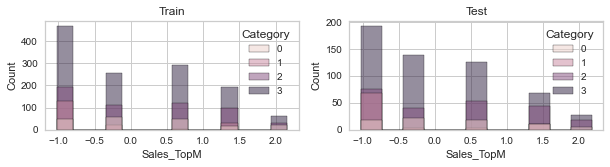

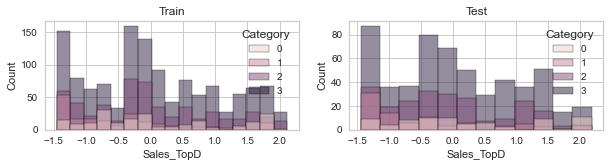

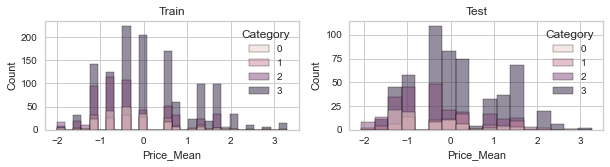

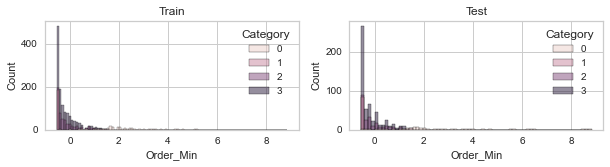

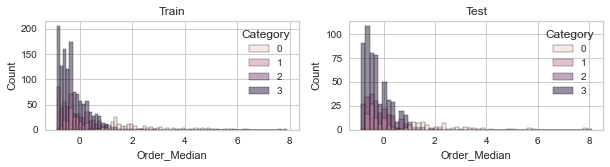

...

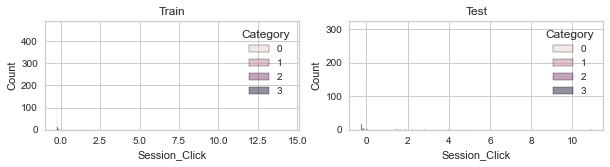

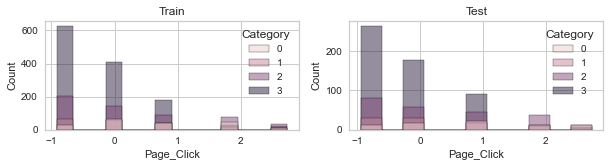

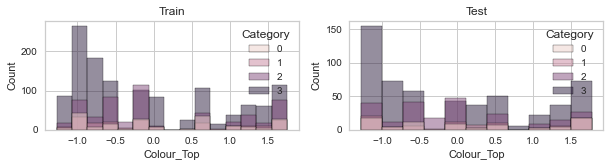

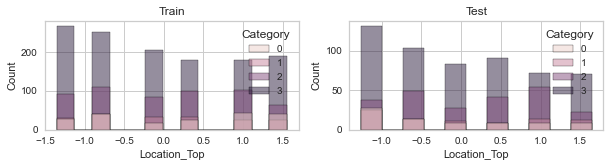

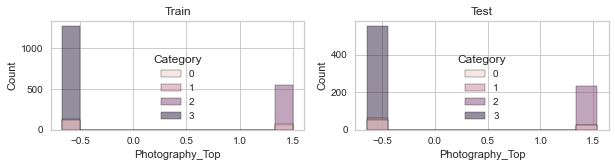

In [93]:
# 카테고리에 따른 변수들의 분포 분류 차이 확인
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(X_train, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(X_test, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Hierarchical Clustering

In [94]:
# 데이터의 거리행렬 변환
X_tr_dist = pdist(X_train, metric='euclidean')
X_tr_dist = pd.DataFrame(squareform(X_tr_dist), 
                         index=['ID_'+str(i) for i in range(X_train.shape[0])], 
                         columns=['ID_'+str(i) for i in range(X_train.shape[0])])
X_tr_dist

,ID_0,ID_1,ID_2,ID_3,ID_4,ID_5,ID_6,ID_7,ID_8,ID_9,...,ID_2188,ID_2189,ID_2190,ID_2191,ID_2192,ID_2193,ID_2194,ID_2195,ID_2196,ID_2197
ID_0,0.00,4.61,2.67,4.48,4.75,4.11,5.04,4.56,5.05,3.41,...,5.31,3.62,4.14,6.09,5.27,3.53,3.45,2.81,3.84,4.43
ID_1,4.61,0.00,4.78,3.24,3.88,4.03,5.29,4.38,4.21,3.77,...,5.11,4.08,6.04,5.82,4.85,3.01,4.04,4.38,4.15,2.80
ID_2,2.67,4.78,0.00,4.15,5.50,4.03,5.92,3.91,4.97,3.37,...,5.80,3.24,3.61,6.71,5.20,2.89,4.02,1.12,4.07,4.35
ID_3,4.48,3.24,4.15,0.00,5.14,4.44,4.82,4.52,5.07,3.12,...,5.01,4.36,5.68,5.62,4.56,2.60,3.93,3.97,3.96,2.14
ID_4,4.75,3.88,5.50,5.14,0.00,3.22,4.54,4.77,3.50,4.14,...,2.83,3.90,5.95,6.25,4.74,4.36,4.43,5.25,4.68,4.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ID_2193,3.53,3.01,2.89,2.60,4.36,3.04,5.43,2.78,3.97,1.63,...,4.91,2.64,4.71,6.06,4.12,0.00,3.33,2.69,3.44,2.93
ID_2194,3.45,4.04,4.02,3.93,4.43,4.35,3.47,4.92,5.01,2.88,...,5.35,4.38,5.34,4.96,4.56,3.33,0.00,3.97,3.59,4.38
ID_2195,2.81,4.38,1.12,3.97,5.25,3.36,5.80,3.40,4.19,3.17,...,5.79,2.91,2.93,6.38,5.02,2.69,3.97,0.00,4.17,3.93
ID_2196,3.84,4.15,4.07,3.96,4.68,4.36,4.29,4.61,5.78,3.47,...,5.76,3.94,5.23,4.84,2.36,3.44,3.59,4.17,0.00,4.40


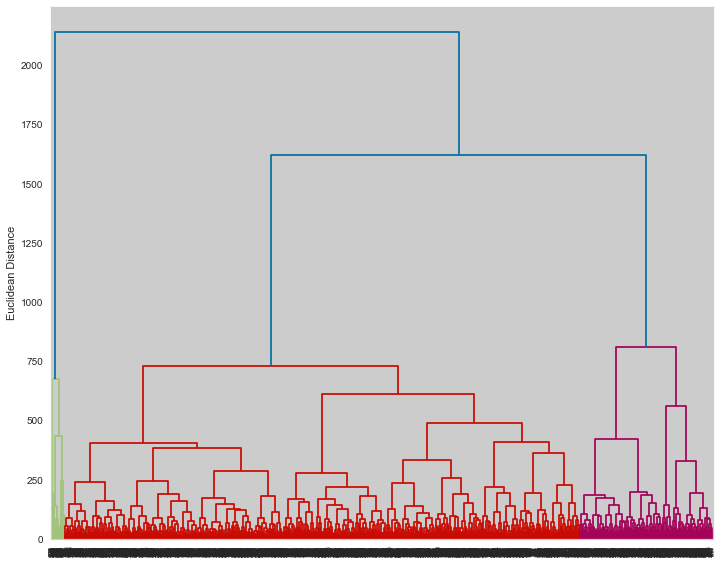

In [95]:
# Linkage 계산
opt_linkage = 'ward'
X_tr_link = linkage(X_tr_dist, method=opt_linkage)
X_tr_link = pd.DataFrame(X_tr_link, 
                         columns=['ID First', 'ID Second', 'Distance', 'No. of Items in Clust.'])

# Dendrogram 시각화
plt.figure(figsize=(10,8))
dendrogram(X_tr_link, orientation='top',
           distance_sort='ascending', 
           show_leaf_counts=True)
plt.tight_layout()
plt.ylabel('Euclidean Distance')
plt.show()

In [96]:
# 모델링
opt_clustnum = len(np.unique(Y_train))
model_aggclust = AgglomerativeClustering(n_clusters=opt_clustnum, 
                                         linkage=opt_linkage)
Y_trpred = model_aggclust.fit_predict(X_train)
Y_tepred = model_aggclust.fit_predict(X_test)

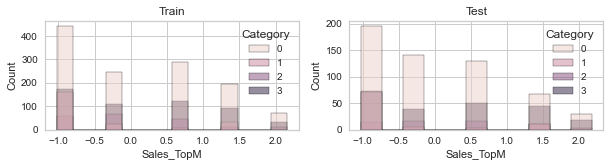

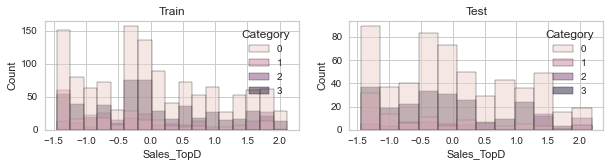

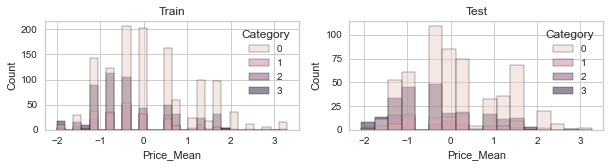

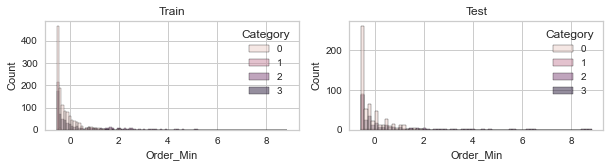

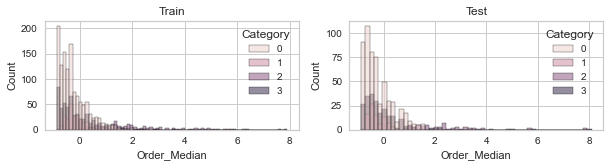

...

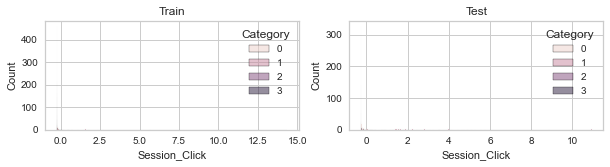

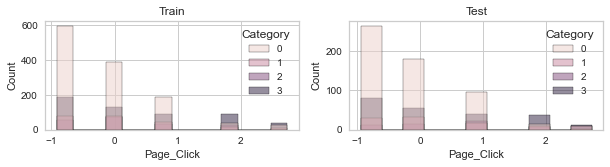

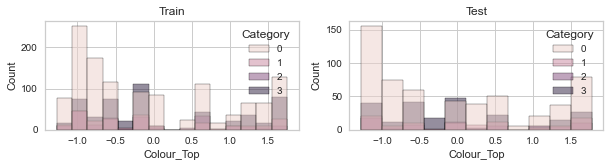

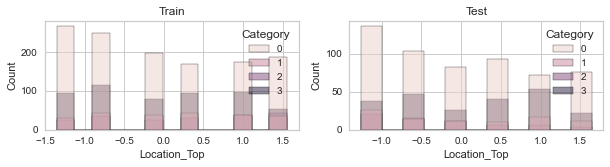

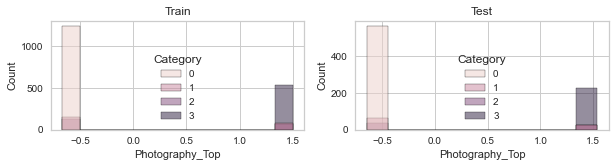

In [97]:
# 카테고리에 따른 변수들의 분포 분류 차이 확인
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(X_train, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(X_test, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Linear Discriminant Analysis

In [98]:
# 모델링
model_lda = LinearDiscriminantAnalysis()
model_lda.fit(X_train, Y_train)
Y_trpred = model_lda.predict(X_train)
Y_tepred = model_lda.predict(X_test)

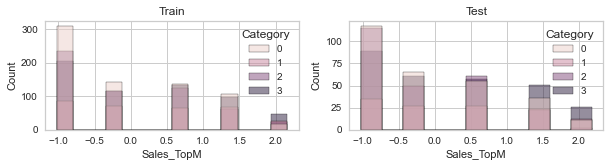

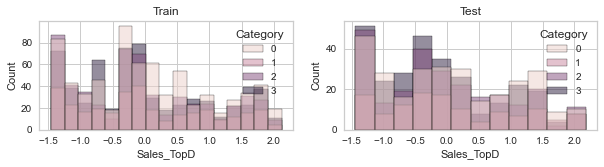

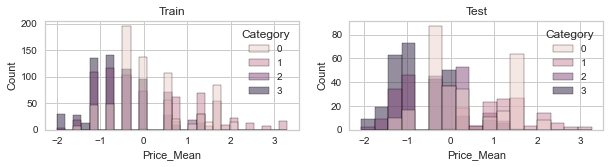

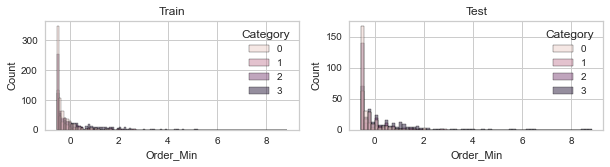

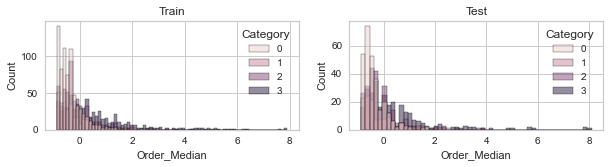

...

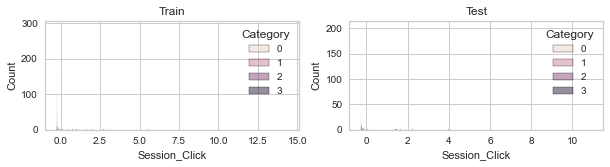

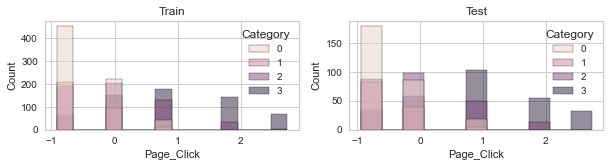

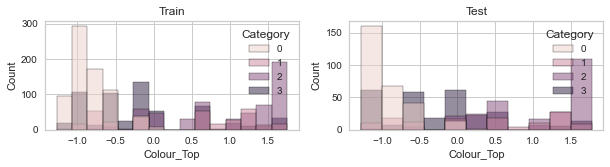

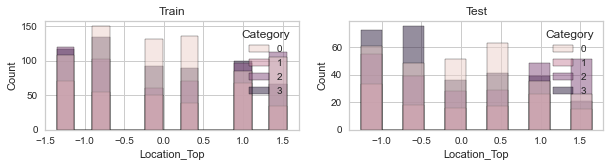

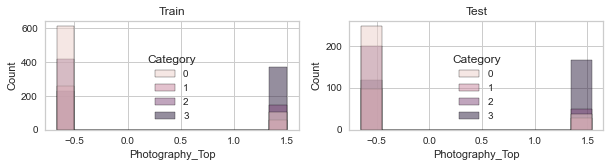

In [99]:
# 카테고리에 따른 변수들의 분포 분류 차이 확인
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(X_train, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(X_test, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

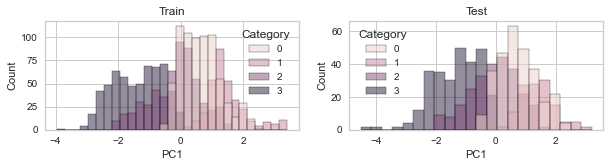

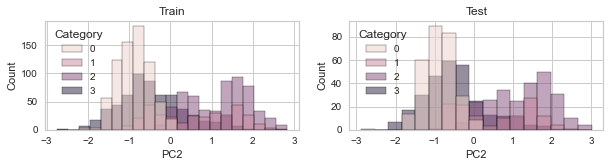

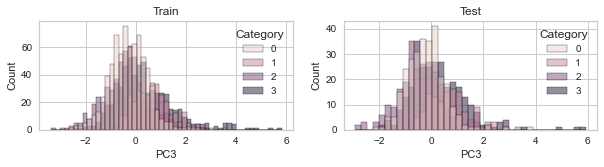

In [100]:
# 카테고리에 따른 주성분들의 분포 분류 차이 확인
colnames = ['PC'+str(i) for i in range(1, model_lda.transform(X_train).shape[1]+1)]
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(model_lda.transform(X_train), columns=colnames)], 
                      axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(model_lda.transform(X_test), columns=colnames)], 
                      axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Quadratic Discriminant Analysis

In [101]:
# 모델링
model_qda = QuadraticDiscriminantAnalysis()
model_qda.fit(X_train, Y_train)
Y_trpred = model_qda.predict(X_train)
Y_tepred = model_qda.predict(X_test)

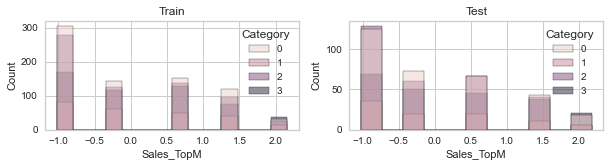

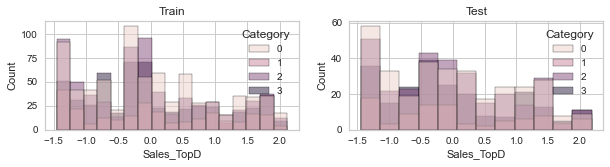

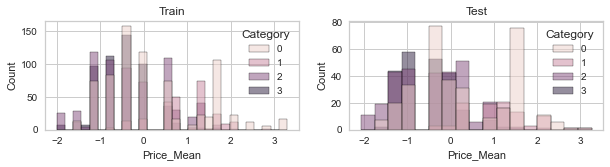

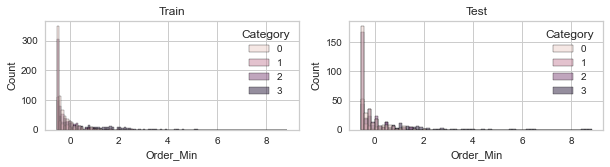

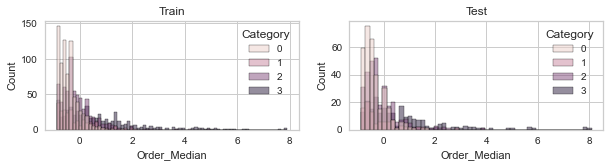

...

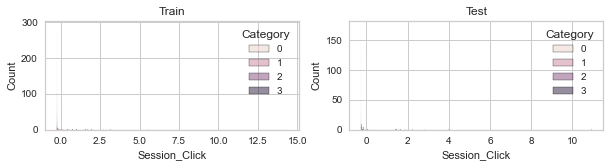

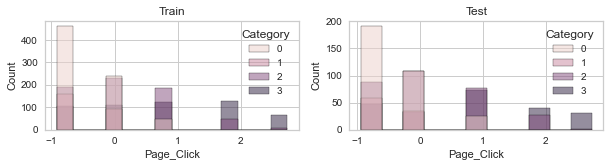

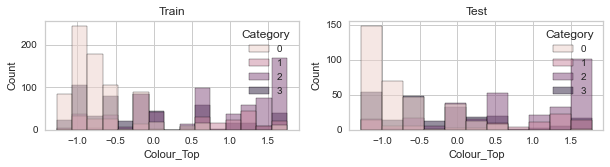

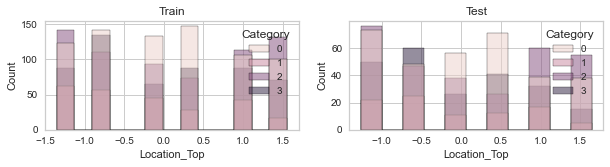

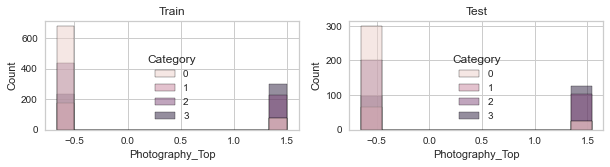

In [102]:
# 카테고리에 따른 변수들의 분포 분류 차이 확인
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(X_train, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(X_test, columns=X_colname).reset_index().iloc[:,1:]], 
                      axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

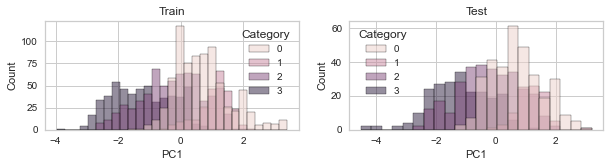

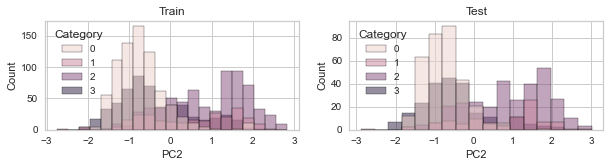

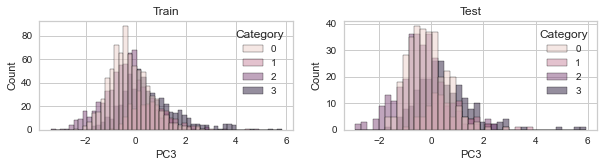

In [103]:
# 카테고리에 따른 주성분들의 분포 분류 차이 확인
colnames = ['PC'+str(i) for i in range(1, model_lda.transform(X_train).shape[1]+1)]
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(model_lda.transform(X_train), columns=colnames)], 
                      axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(model_lda.transform(X_test), columns=colnames)], 
                      axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Principal Component Analysis

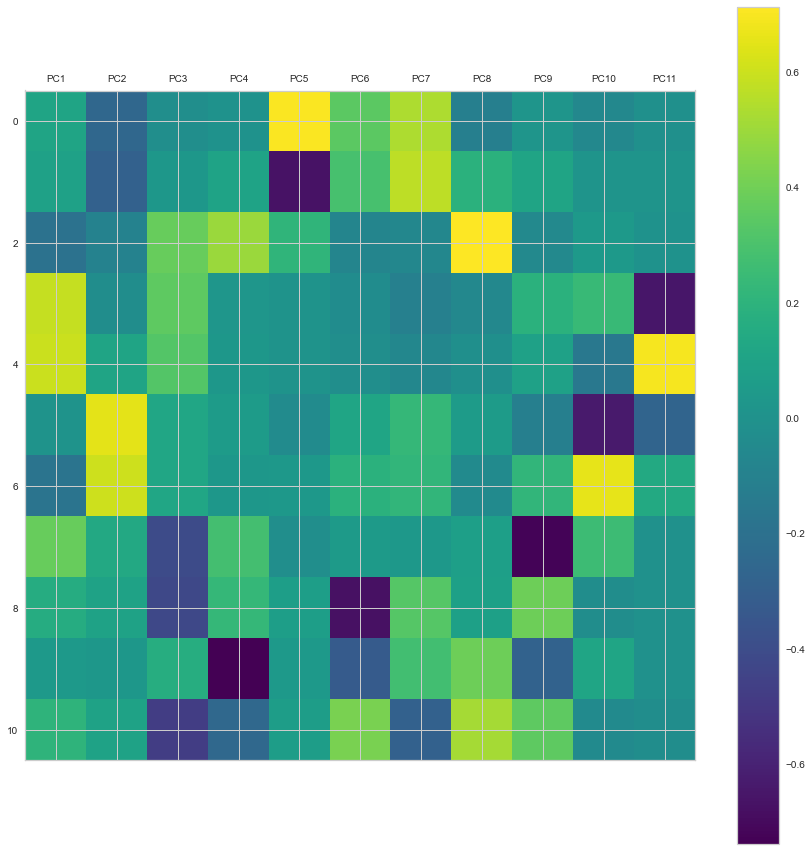

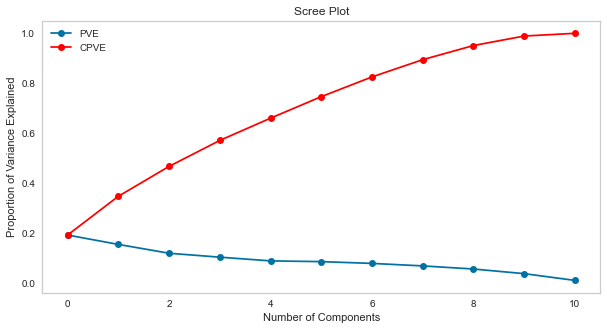

In [104]:
# 데이터의 주성분 추출
model_pca = PCA()
model_pca.fit(X_train)
X_train_pca = model_pca.transform(X_train)
X_test_pca = model_pca.transform(X_test)

# 고유벡터 시각화 및 변수별 이해
plt.figure(figsize=(15,15))
plt.matshow(model_pca.components_.T, cmap='viridis', fignum=1)
colnames = ['PC'+str(i) for i in range(1, X_train_pca.shape[1]+1)]
plt.xticks([i for i in range(X_train_pca.shape[1])], colnames)
plt.colorbar()
plt.show()

# Scree Plot
plt.figure(figsize=(10,5))
plt.plot(model_pca.explained_variance_ratio_, 'o-', label='PVE')
plt.plot(model_pca.explained_variance_ratio_.cumsum(), 'o-', c='red', label='CPVE')
plt.legend()
plt.title('Scree Plot')
plt.xlabel('Number of Components')
plt.ylabel('Proportion of Variance Explained')
plt.grid()
plt.show()

In [105]:
# 최적 주성분 갯수
n_optpc = (model_pca.explained_variance_ratio_.cumsum() < 0.8).sum()
n_optpc

7

In [106]:
# 주성분 데이터 정리
colnames = ['PC'+str(i) for i in range(1, X_train_pca.shape[1]+1)]
X_train_pca = pd.DataFrame(X_train_pca, columns=colnames).iloc[:,:n_optpc]
X_test_pca = pd.DataFrame(X_test_pca, columns=colnames).iloc[:,:n_optpc]
X_train_pca.describe()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
count,"2,198.00","2,198.00","2,198.00","2,198.00","2,198.00","2,198.00","2,198.00"
mean,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00
std,1.46,1.31,1.15,1.07,0.99,0.97,0.93
min,-4.09,-2.01,-3.45,-2.39,-2.40,-2.84,-2.52
25%,-0.93,-0.76,-0.75,-0.78,-0.70,-0.66,-0.66
50%,-0.33,-0.33,0.07,0.01,-0.02,0.04,-0.02
75%,0.58,0.29,0.72,0.75,0.62,0.71,0.66
max,10.08,9.89,6.89,3.02,3.10,3.30,3.29


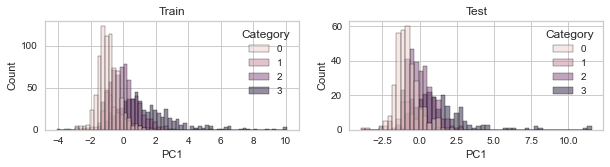

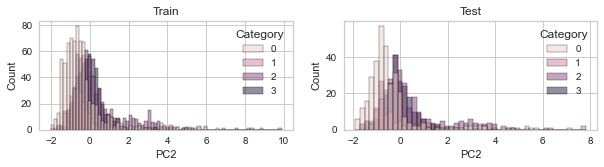

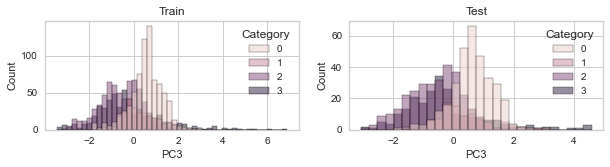

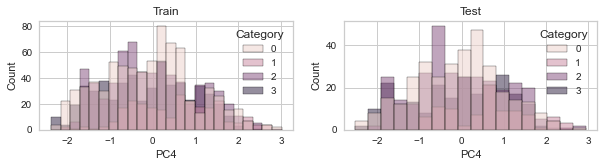

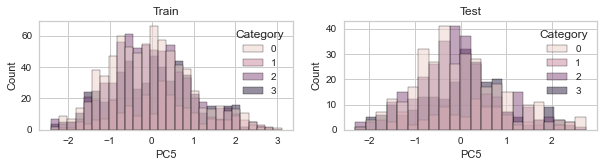

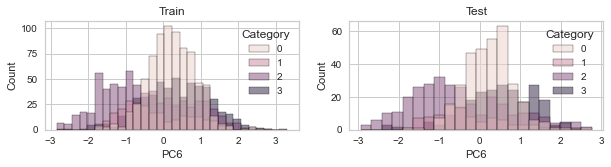

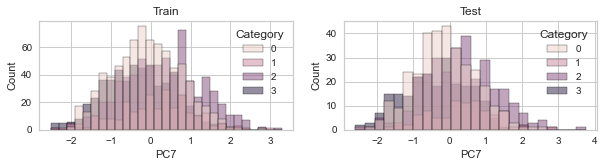

In [107]:
# 카테고리에 따른 주성분들의 분포 분류 차이 확인
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), X_train_pca], axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), X_test_pca], axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Factor Analysis

In [108]:
# 요인추출 가능성 확인
# Bartlett's Test
statistics_bar, p_value = calculate_bartlett_sphericity(X_train)
statistics_bar, p_value

(4945.558935490168, 0.0)

In [109]:
# 요인추출 가능성 확인
# Kalser-Meyer-Olkln (KMO) Test
kmo_each, kmo_all = calculate_kmo(X_train)
kmo_each, kmo_all

(array([0.76370792, 0.74860452, 0.62353463, 0.46845945, 0.4609489 ,
        0.36483753, 0.46753156, 0.63770859, 0.58625526, 0.43033414,
        0.5908869 ]),
 0.47676799814556164)

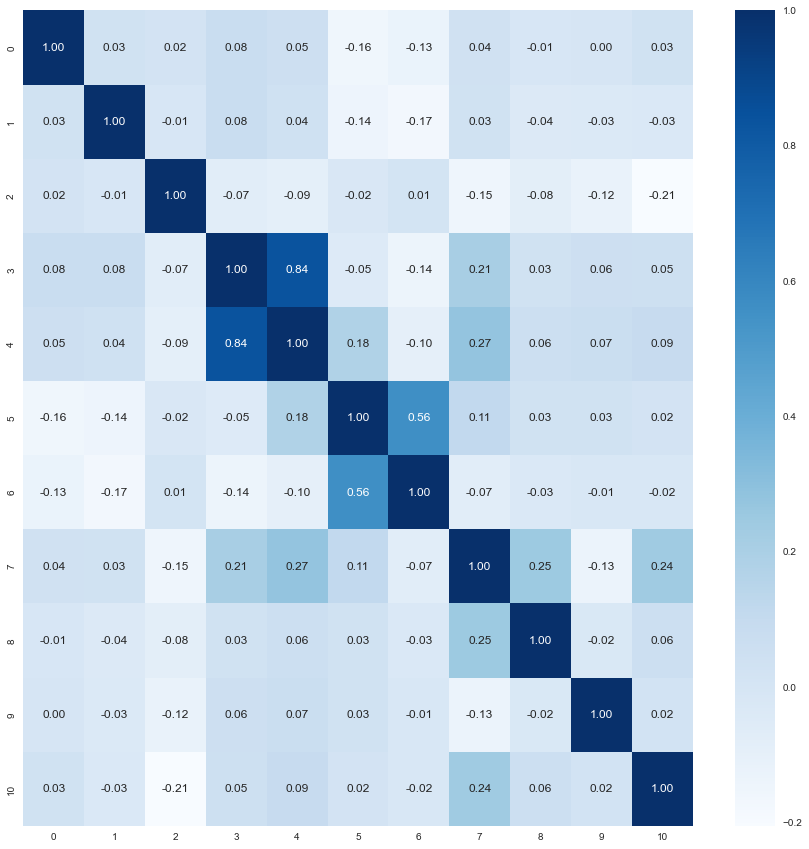

In [110]:
# 상관관계
# 강하게 묶이는 변수 관계성 확인
plt.figure(figsize=(15,15))
sns.heatmap(pd.DataFrame(X_train).corr(), 
            cmap='Blues', annot=True, fmt='.2f')
plt.show()

,Original_Eigenvalues,Factor_Eigenvalues
0,2.12,1.96
1,1.71,1.38
2,1.32,0.71
3,1.14,0.39
4,0.98,0.22
5,0.95,0.18
6,0.87,0.12
7,0.76,0.07
8,0.62,0.04
9,0.42,-0.03


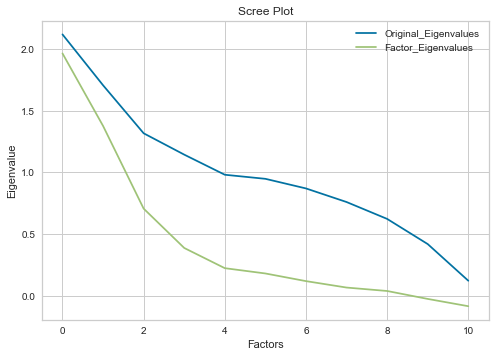

4

In [111]:
# 모델링1
# 최적 요인 수 추론
model_fa = FactorAnalyzer(n_factors=10)
model_fa.fit(X_train)
eigenvalues, factor_eigenvalues = model_fa.get_eigenvalues()
fa_result = pd.DataFrame([eigenvalues, factor_eigenvalues], 
                          index=['Original_Eigenvalues', 'Factor_Eigenvalues']).T
display(fa_result)

# Create scree plot using matplotlib
fa_result.plot()
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid(True)
plt.show()

# 최적 요인 갯수
n_optfactor = (fa_result['Original_Eigenvalues']>=1).sum()
n_optfactor

In [112]:
# 모델링2
# 최적 요인 수 비교를 위한 귀무가설/대중주장/H0 확인
# 요인 적재량 확인
model_fa = FactorAnalyzer(n_factors=n_optfactor, rotation='varimax')
model_fa.fit(X_train)
colnames = ['Factor' + str(i) for i in range(n_optfactor)]
fa_loadings = pd.DataFrame(model_fa.loadings_, 
                           index=X_colname,
                           columns=colnames)
fa_loadings

,Factor0,Factor1,Factor2,Factor3
Sales_TopM,0.05,-0.19,0.02,0.01
Sales_TopD,0.04,-0.20,0.01,0.02
Price_Mean,-0.00,-0.01,-0.23,0.62
Order_Min,0.82,-0.19,0.08,-0.08
Order_Median,0.99,-0.02,0.13,-0.10
Order_Max,0.17,0.87,0.11,0.02
Session_Click,-0.05,0.66,-0.04,0.02
Page_Click,0.16,-0.04,0.98,0.12
Colour_Top,0.02,-0.00,0.25,-0.03
Location_Top,0.07,0.03,-0.11,-0.23


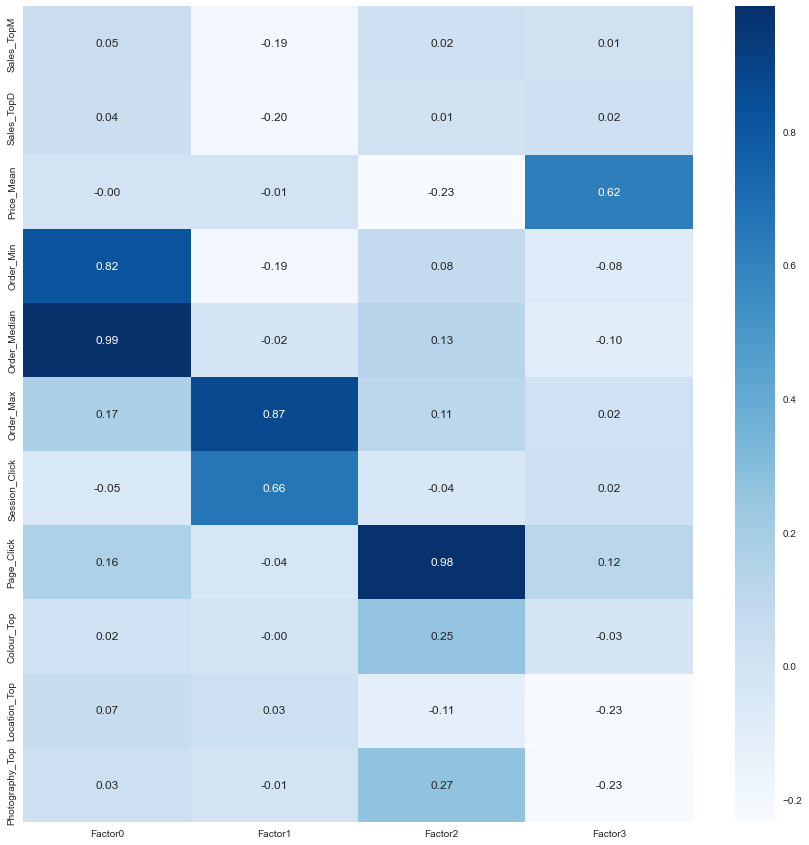

,Factor0,Factor1,Factor2,Factor3
Sales_TopM,0.050992,-0.191991,0.019668,0.012434
Sales_TopD,0.044049,-0.200545,0.009313,0.019638
Price_Mean,-0.001531,-0.006136,-0.232697,0.624165
Order_Min,0.820348,-0.192431,0.076912,-0.075100
Order_Median,0.987426,-0.021490,0.133364,-0.097263
Order_Max,0.168658,0.869760,0.114461,0.017875
Session_Click,-0.049023,0.658418,-0.039425,0.023051
Page_Click,0.163059,-0.037897,0.976915,0.118809
Colour_Top,0.018787,-0.000198,0.254798,-0.027160
Location_Top,0.065472,0.025291,-0.114220,-0.233582


,Factor0,Factor1,Factor2,Factor3
Variance,1.72,1.31,1.20,0.53
Proportional Variance,0.16,0.12,0.11,0.05
Cumulative Variances,0.16,0.27,0.38,0.43


In [113]:
# 귀무가설/대중주장/H0에서의 요인과 변수관계 시각화
plt.figure(figsize=(15,15))
sns.heatmap(fa_loadings, cmap='Blues', annot=True, fmt='.2f')
plt.show()

criteria = pd.Series([0.5]*n_optfactor, index=colnames)
fa_loadings_light = fa_loadings.style.highlight_between(left=criteria, right=1, axis=1, 
                                                        props='color:white; background-color:purple;')
criteria = pd.Series([-1]*n_optfactor, index=colnames)
fa_loadings_light = fa_loadings_light.highlight_between(left=criteria, right=-0.5, axis=1, 
                                                        props='color:white; background-color:purple;')
display(fa_loadings_light)

fa_variance = pd.DataFrame(model_fa.get_factor_variance(), columns=colnames,
                           index=['Variance', 'Proportional Variance', 'Cumulative Variances'])
fa_variance

In [114]:
# 공통성 추정
# 변수의 분산이 추출된 요인들에 의해 설명되는 정도로 0.5이상 굳
fa_communality = pd.DataFrame(model_fa.get_communalities(), 
                              index=X_colname, columns=['Communality'])

criteria = pd.Series([0.5]*len(fa_communality.columns), index=fa_communality.columns)
fa_communality_light = fa_communality.style.highlight_between(left=criteria, right=10, axis=1, 
                                                              props='color:white; background-color:purple;')
fa_communality_light

,Communality
Sales_TopM,0.040002
Sales_TopD,0.042631
Price_Mean,0.443769
Order_Min,0.721556
Order_Median,1.002718
Order_Max,0.798350
Session_Click,0.438003
Page_Click,0.996503
Colour_Top,0.066013
Location_Top,0.072533


In [115]:
# 변수들이 특정 요인으로 묶이는지 여부 확인
# 설문조사에서는 역으로 특정 항목(요인)을 확인하는 설문 질문들이
# 일관성 있는 유의정도(Factor Loading)인지 여부 확인하여 질문의 타당성 확인
# 일반적으로 크롬바흐 알파계수로 판단
import pingouin as pg

colA = ['Order_Min', 'Order_Median']
colB = ['Order_Max', 'Session_Click']

df_cronbach = []
for col_sub in [colA, colB]:
    df_cronbach.append(pg.cronbach_alpha(data=df_product[col_sub])[0])
pd.DataFrame(df_cronbach, columns=['Cronbach Alpha'],
             index=['A', 'B'])

,Cronbach Alpha
A,0.91
B,0.39


In [116]:
# 원데이터에서 요인 잠재변수 추출
X_train_fa = pd.DataFrame(model_fa.transform(X_train), columns=colnames)
X_test_fa = pd.DataFrame(model_fa.transform(X_test), columns=colnames)
X_test_fa

,Factor0,Factor1,Factor2,Factor3
0,-0.10,-0.62,-0.16,0.90
1,-0.48,-0.62,1.96,-0.41
2,-0.68,-0.23,-0.86,0.08
3,0.64,-0.37,-0.99,-0.88
4,-0.55,0.15,-0.70,-1.27
...,...,...,...,...
938,-0.07,1.79,0.11,-0.41
939,-0.91,-0.65,0.91,1.00
940,-0.09,-0.54,0.85,0.43
941,0.57,-0.31,-1.07,0.09


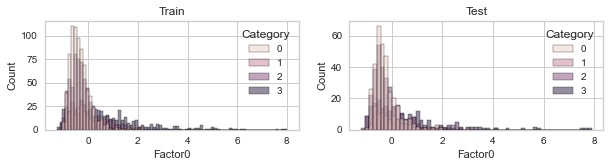

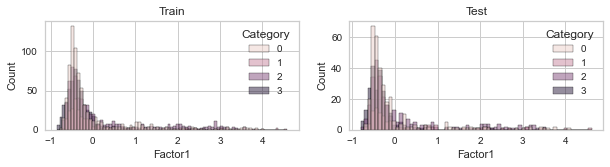

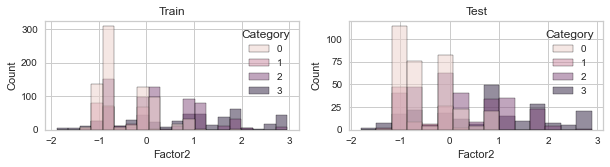

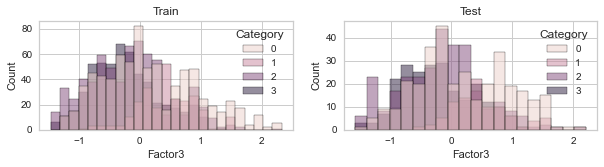

In [117]:
# 카테고리에 따른 주성분들의 분포 분류 차이 확인
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), X_train_fa], axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), X_test_fa], axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()

## Non-negative Matrix Factorization

In [118]:
# 데이터 로딩
df = pd.read_csv(os.path.join('.', 'Data', 'OnlineShopping', 'online_shopping.csv'))

# 카테고리 변수의 문자 변환
colname_category = ['Year', 'Month', 'Day', 'Country', 'Session ID', 'Page', 
                    'Category', 'Category-Model', 'Colour', 'Location', 'Model Photography']
df[colname_category] = df[colname_category].astype(str)

# 상품 별 정보 생성
from scipy.stats import mode
feature_logic = {'Month': [('Sales_TopM', lambda x: mode(x)[0][0])],
                 'Day': [('Sales_TopD', lambda x: mode(x)[0][0])],
                 'Price': [('Price_Mean','mean')],
                 'Order': [('Order_Min','min'),  ('Order_Median','median'), ('Order_Max','max')],
                 'Session ID': [('Session_Click',pd.Series.nunique)],
                 'Page': [('Page_Click', lambda x: mode(x)[0][0])],
                 'Colour': [('Colour_Top', lambda x: mode(x)[0][0])],
                 'Location': [('Location_Top', lambda x: mode(x)[0][0])],
                 'Model Photography': [('Photography_Top', lambda x: mode(x)[0][0])]}
df_product = df.groupby(by=['Country', 'Category', 'Category-Model']).agg(feature_logic)
df_product.columns = df_product.columns.droplevel(0)

# 데이터분리
Y_colname = ['Category']
X_colname = [col for col in df_product.columns if col not in Y_colname]
if Y_colname[0] not in df_product.columns:
    df_product.reset_index(inplace=True)
    del df_product['Category-Model']
    del df_product['Country']
df_product[Y_colname] = df_product[Y_colname].astype(int)-1

X_train, X_test, Y_train, Y_test = train_test_split(df_product[X_colname], df_product[Y_colname], 
                                                    train_size=0.7, random_state=123)

# 스케일링
X_colname = X_train.columns
scaler = preprocessing.MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
pd.DataFrame(X_test, columns=X_colname).describe().T
pd.DataFrame(X_test).describe().T

,count,mean,std,min,25%,50%,75%,max
0,943.00,0.32,0.31,0.00,0.00,0.25,0.50,1.00
1,943.00,0.40,0.28,0.00,0.18,0.37,0.60,1.00
2,943.00,0.39,0.19,0.00,0.23,0.39,0.53,1.00
3,943.00,0.06,0.11,0.00,0.00,0.02,0.07,1.00
4,943.00,0.10,0.11,0.00,0.03,0.06,0.12,1.00
5,943.00,0.16,0.21,0.00,0.04,0.08,0.17,1.00
6,943.00,0.02,0.09,0.00,0.00,0.00,0.00,1.00
7,943.00,0.26,0.27,0.00,0.00,0.25,0.50,1.00
8,943.00,0.42,0.33,0.00,0.15,0.38,0.62,1.00
9,943.00,0.43,0.34,0.00,0.20,0.40,0.80,1.00


In [119]:
# 모델링
n_factor = 5
model_nmf = NMF(n_components=n_factor, random_state=123)
model_nmf.fit(X_train)
X_train_nmf = model_nmf.transform(X_train)
X_test_nmf = model_nmf.transform(X_test)

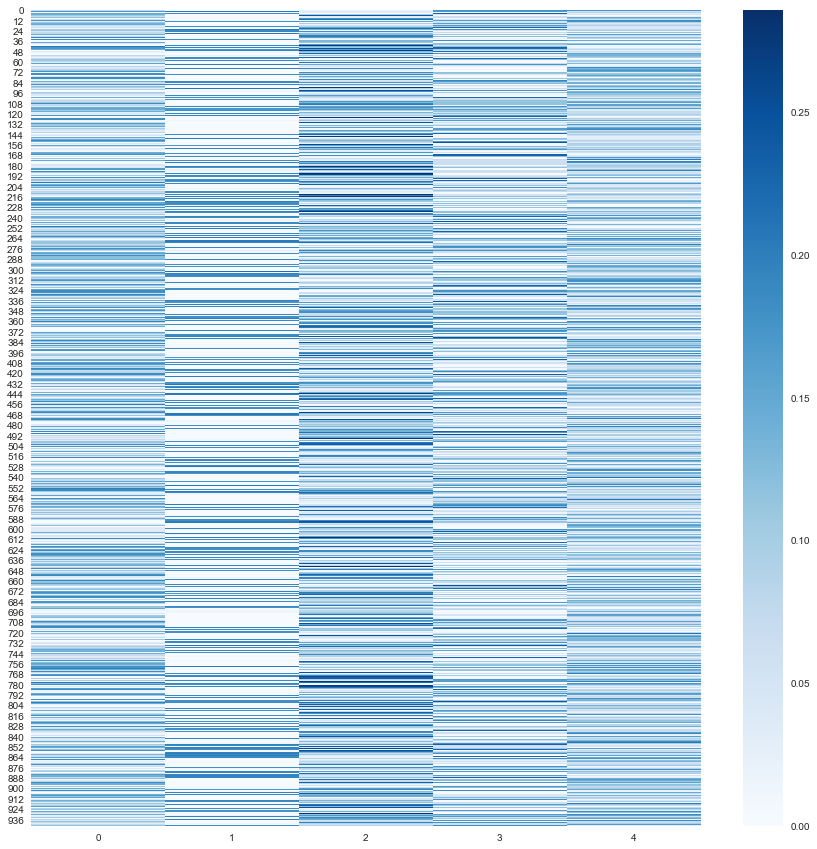

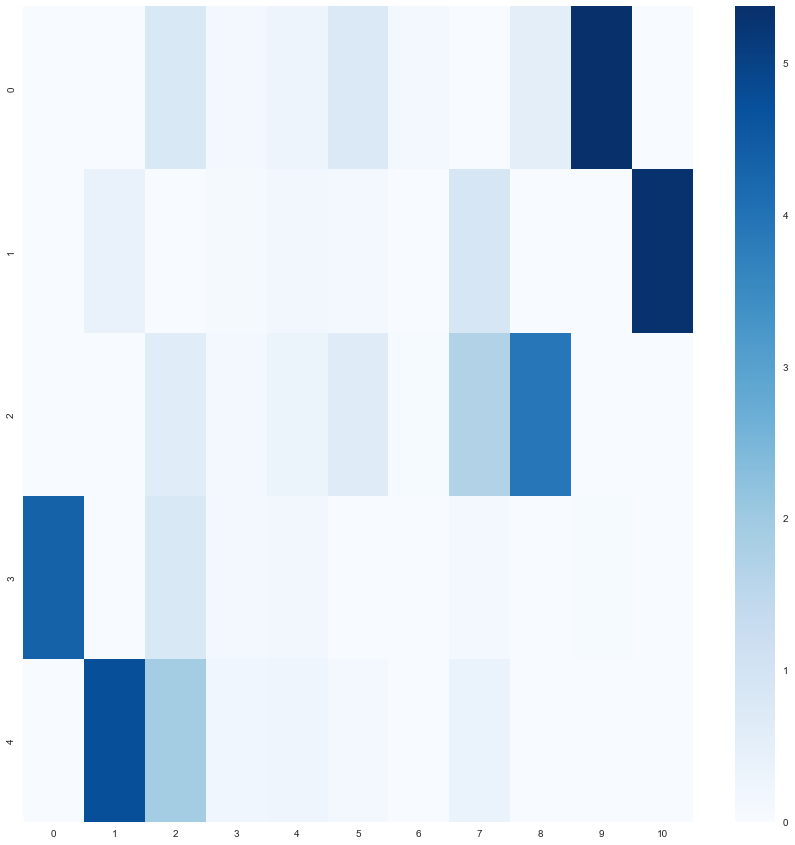

In [120]:
# Test 가중치 행렬 W 시각화
plt.figure(figsize=(15,15))
sns.heatmap(X_test_nmf, cmap='Blues', annot=False, fmt='.2f')
plt.show()

# 특성 행렬 H 시각화
plt.figure(figsize=(15,15))
sns.heatmap(model_nmf.components_, cmap='Blues', annot=False, fmt='.2f')
plt.show()

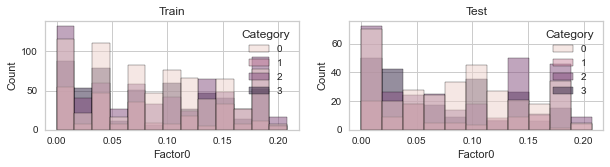

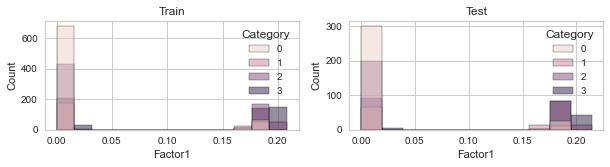

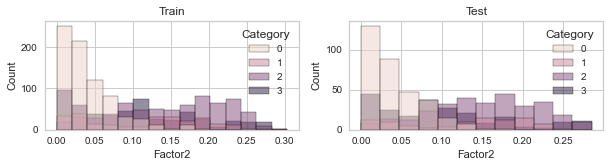

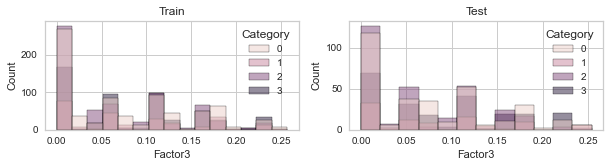

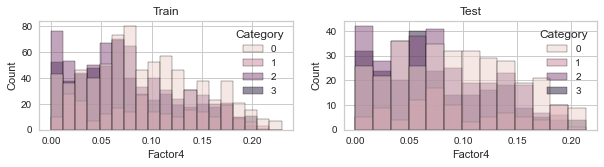

In [121]:
# 카테고리에 따른 주성분들의 분포 분류 차이 확인
colnames = ['Factor' + str(i) for i in range(n_factor)]
Y_trpredX = pd.concat([pd.DataFrame(Y_trpred, columns=Y_colname), 
                       pd.DataFrame(X_train_nmf, columns=colnames)], axis=1)
Y_tepredX = pd.concat([pd.DataFrame(Y_tepred, columns=Y_colname), 
                       pd.DataFrame(X_test_nmf, columns=colnames)], axis=1)

for col in Y_trpredX.iloc[:,1:].columns:
    fig, axes = plt.subplots(1, 2, figsize=(10,2))
    sns.histplot(data=Y_trpredX, x=col, hue=Y_colname[0], ax=axes[0])
    axes[0].set_title('Train')
    sns.histplot(data=Y_tepredX, x=col, hue=Y_colname[0], ax=axes[1])
    axes[1].set_title('Test')
    plt.show()